# Autonomous Farming: Corn Row Alignment Scoring

This notebook was created during our internship with **VexTronics** by four students from Eindhoven University of Technology:

- Merve Şafak (2235943)
- Athanasios Poulis (2235309)
- Alecsandru Kreefft-Libiu (2371723)
- Miquel Suasso de Lima de Prado (1580140)

In this project, we worked on a computer vision pipeline for analyzing corn plant alignment from top-down images. The idea behind the project was that the way corn plants are positioned and oriented in a row can influence how well they use space and sunlight. Instead of only looking at the field manually, we wanted to build a system that could automatically detect the plants, measure their position and leaf direction, and give a clear score for how well they are aligned.

We used top-down images because they make it easier to see the row structure and the direction of the leaves. From this perspective, we can compare each plant with the expected planting row and check whether the stem is placed correctly and whether the leaves are pointing in the desired direction.

The notebook gives each detected corn plant two main measurements:

- **Positional error:** how far the stem is from the row line.
- **Angular error:** how much the leaf direction differs from the expected direction.

These two errors are combined into an **alignment score from 0 to 100**. A high score means that the plant is close to the row line and its leaves are well oriented. A lower score means that the plant is either shifted away from the row, rotated differently than expected, or both.

We also calculate row-level averages, because looking at only one plant is not always enough. By averaging the scores per row, we can better understand whether a whole row was planted consistently or whether there are larger alignment problems.

## What this notebook does

| # | Task | Location in notebook |
|---|------|----------------------|
| 1 | Detect individual corn plants in an image | Section 4: Training, Section 5: Evaluation |
| 2 | Estimate each plant’s position and leaf orientation | Section 6: Inference |
| 3 | Define the expected row direction | Section 8: Optimal line |
| 4 | Measure how much each plant deviates from the row | Section 9: Scoring |
| 5 | Export plant-level and row-level alignment scores | Section 9: Scoring, Section 10: Batch export |

## How the pipeline works

### 1. Image input

We start with a top-down image of a corn field or a controlled planting setup. We chose this type of image because it gives a clear view of the plant stems, leaves, and row layout. This makes it possible to measure alignment in a more structured way.

### 2. Plant detection

We used a **YOLO11-pose** model to detect the plants. We chose a pose model because we did not only need bounding boxes around the plants. We also needed specific points on each plant to estimate its position and direction.

For every detected object, the model predicts:

- the class, for example corn or weed;
- a bounding box around the object;
- three keypoints:
  - stem center;
  - first leaf tip;
  - second leaf tip.

We included weeds as a separate class because field images are not always clean. Weeds can appear between corn plants and could confuse the model if they are not handled properly. However, after detection, we filter them out and only use corn plants for the final scoring.

### 3. Measuring plant position and orientation

After detecting the plants, we use the predicted keypoints to calculate the measurements we need.

We use the **stem center** as the position of the plant. This tells us where the plant is located compared to the row.

We use the line between the two leaf tips to estimate the **leaf orientation**. This gives us an approximate direction of how the leaves are spreading.

We did this because the project is not only about detecting whether a plant exists. The important part is understanding whether the plant is placed and oriented correctly.

### 4. Row estimation

After the plant positions are known, we define the row that each plant should belong to. For this, the notebook can either fit a line through the detected stem positions or use a known planting layout if that information is available.

This row line becomes the reference for scoring. If a plant is close to the line, it is considered better aligned. If it is far away from the line, the positional error becomes larger.

We added this step because alignment only makes sense when there is a reference. A plant cannot be called “misaligned” unless we know where the row is supposed to be.

### 5. Alignment scoring

The final step is scoring each plant. For every corn plant, we ask two questions:

1. How far is the stem from the expected row line?
2. How different is the leaf direction from the expected direction?

The first question gives the positional error. The second question gives the angular error.

We combine these into one score between **0 and 100**, so the result is easier to understand. Instead of only showing raw pixel and angle values, the score gives a quick indication of how good or bad the alignment is.

The notebook produces:

- plant-level scores, so each plant can be checked individually;
- row-level averages, so the overall quality of each row can be compared;
- exported results, so the measurements can be used later for analysis or reporting.

## Why we built it this way

We built the notebook step by step so that each part of the pipeline is understandable and can be improved later. Detection, keypoint estimation, row fitting, and scoring are separated on purpose. This makes it easier for future teams to replace one part of the system without rewriting everything.

For example, if a better detection model is trained later, it can replace the current YOLO model while keeping the same scoring logic. If a better row-fitting method is added, the rest of the pipeline can still stay mostly the same.

The main reason for using this structure was to make the project useful beyond our internship. Future teams should be able to open the notebook, understand what each step does, and continue from where we stopped.

## Final output

At the end of the notebook, the system can produce:

- detected corn plants with bounding boxes and keypoints;
- estimated stem positions;
- estimated leaf orientations;
- row reference lines;
- positional error per plant;
- angular error per plant;
- final alignment score per plant;
- average alignment score per row;
- exported results for batch analysis.

Overall, this notebook turns a top-down corn image into measurable alignment information. The goal is not only to detect plants, but to give useful feedback about planting quality in a way that is clear, repeatable, and easy to build on.

# 1. Setup

To run the notebook please make sure to:

1. Confirm the GPU is working. Training on CPU would take days.
2. Set the project folder so all outputs land in one place.
3. Import the libraries used throughout.

## Install these packages first (once, from your terminal)

In [65]:
import torch  # PyTorch — the deep learning framework YOLO is built on

# torch.cuda.is_available() returns True if an NVIDIA GPU + compatible drivers are installed.
# The `assert` line crashes loudly if this returns False, so you find out NOW, not 3 hours into training.
assert torch.cuda.is_available(), "No GPU detected. Check CUDA install / PyTorch version."

# Print GPU model name (useful to confirm you're using the right one if you have multiple).
print(f"GPU:  {torch.cuda.get_device_name(0)}")
print(f"CUDA: {torch.version.cuda}")

GPU:  NVIDIA RTX 1000 Ada Generation Laptop GPU
CUDA: 12.8


In [66]:
import os
from pathlib import Path
PROJECT_ROOT = Path(r"C:\Users\atpou\projects\alecs_draft\alecs_draft")  # Change this to your project root folder

# Create the folder if it doesn't already exist. exist_ok=True means "don't error if it's already there".
PROJECT_ROOT.mkdir(parents=True, exist_ok=True)

# Change the working directory so relative paths in later cells resolve here.
os.chdir(PROJECT_ROOT)

print(f"Working from: {PROJECT_ROOT}")

Working from: C:\Users\atpou\projects\alecs_draft\alecs_draft


In [67]:
import json          # read/write JSON files
import shutil        # copy / delete directories
import random        # Python's built-in random number generator
import yaml          # read/write YAML files (used for YOLO's config format)
from collections import defaultdict  # a dict that auto-creates missing keys as empty lists — handy for grouping
import numpy as np              # arrays and linear algebra — the workhorse of anything numerical in Python
import cv2                      # OpenCV — image loading, drawing, classical computer vision
import matplotlib.pyplot as plt # plotting — how we visualize images inline
from sklearn.cluster import DBSCAN  # clustering algorithm we'll use for row assignment

SEED = 42
random.seed(SEED)         # seed Python's random
np.random.seed(SEED)      # seed NumPy's random
torch.manual_seed(SEED)   # seed PyTorch's random (for weight init, augmentations, etc.)

# Constants describing our annotation scheme: 3 keypoints per plant, in a fixed order.
NUM_KEYPOINTS = 3
KP_STEM  = 0   # index 0 in the keypoint list = stem center
KP_LEFT  = 2   # index 1 = leaf-tip-left
KP_RIGHT = 1   # index 2 = leaf-tip-right

# 2. Dataset preparation

The dataset is a folder of corn photos, each paired with a text file listing every plant in that image: bounding box coordinates and three keypoints. Images and labels get split into train/ and valid/.

## Annotation format

Exported from Roboflow in YOLOv8 Pose format. Each label file has one line per plant:

In [68]:
# Where the raw Roboflow export lives
RAW_DATASET = PROJECT_ROOT / 'raw_dataset'
assert RAW_DATASET.exists(), f"Unzip your Roboflow export into {RAW_DATASET}"

# Walk the expected subfolders and print counts
for split in ['train', 'valid', 'test']:   # 'test' is optional — many exports skip it
    img_dir = RAW_DATASET / split / 'images'
    lbl_dir = RAW_DATASET / split / 'labels'
    if img_dir.exists():
        # .glob('*') returns every file; len(list(...)) counts them
        n_img = len(list(img_dir.glob('*')))
        n_lbl = len(list(lbl_dir.glob('*.txt'))) if lbl_dir.exists() else 0
        print(f"{split:6s}  images={n_img:4d}  labels={n_lbl:4d}")
        # If images and labels don't match, something is wrong with the export
        if n_img != n_lbl:
            print(f"  WARNING: image count and label count don't match for {split}!")

# After the existing image/label counts, add per-class instance counting:
from collections import Counter
class_counts = Counter()
for split in ['train', 'valid', 'test']:
    lbl_dir = RAW_DATASET / split / 'labels'
    if not lbl_dir.exists():
        continue
    for lbl in lbl_dir.glob('*.txt'):
        with open(lbl) as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    class_counts[int(float(parts[0]))] += 1

print("\nInstances per class (across all splits):")
print(f"  corn (0): {class_counts.get(0, 0)}")
print(f"  weed (1): {class_counts.get(1, 0)}")
if class_counts.get(0, 0) > 0:
    ratio = class_counts.get(1, 0) / class_counts.get(0, 0)
    print(f"  weed:corn ratio = {ratio:.1f} : 1")

train   images=1684  labels=1684
valid   images= 141  labels= 141
test    images=  51  labels=  51

Instances per class (across all splits):
  corn (0): 478
  weed (1): 91128
  weed:corn ratio = 190.6 : 1


In [69]:
def canonicalize_label_file(src_path: Path, dst_path: Path):
    """Pass-through: trust the annotator's order."""
    dst_path.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(src_path, dst_path)

# We write the cleaned dataset into a separate folder so the raw export is untouched.
# This means you can re-run this cell safely without losing the original labels.
DATASET_ROOT = PROJECT_ROOT / 'dataset'

# If the cleaned dataset already exists from a previous run, delete it first.
if DATASET_ROOT.exists():
    shutil.rmtree(DATASET_ROOT)

# Walk each split (train/valid/test) and process every label file
for split in ['train', 'valid', 'test']:
    src_img = RAW_DATASET / split / 'images'
    src_lbl = RAW_DATASET / split / 'labels'
    if not src_img.exists():  # skip splits that don't exist (e.g. if no test set)
        continue

    dst_img = DATASET_ROOT / split / 'images'
    dst_lbl = DATASET_ROOT / split / 'labels'
    dst_img.mkdir(parents=True, exist_ok=True)
    dst_lbl.mkdir(parents=True, exist_ok=True)

    # Copy images (not symlinks, because Windows symlinks require admin permissions)
    for img in src_img.iterdir():
        tgt = dst_img / img.name
        if not tgt.exists():
            shutil.copy2(img, tgt)  # copy2 preserves metadata like modification time

    # Process and rewrite every label file
    for lbl in src_lbl.glob('*.txt'):
        canonicalize_label_file(lbl, dst_lbl / lbl.name)

    print(f"{split:6s}  done")

train   done
valid   done
test    done


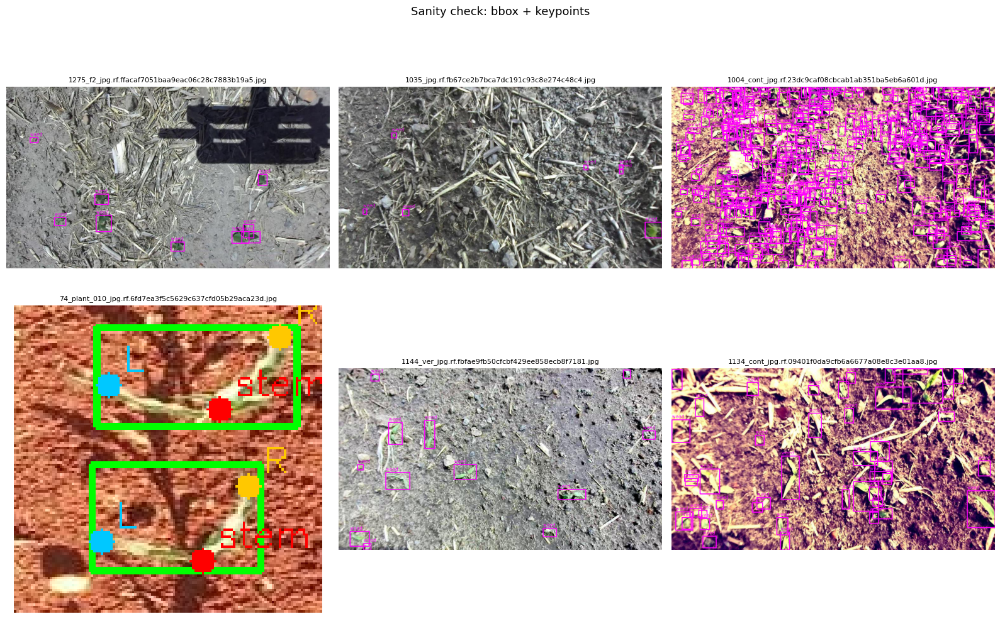

In [70]:
def draw_annotation(img, label_path):
    """Overlay bbox + keypoints, color-coded by class (corn=green, weed=magenta)."""
    H, W = img.shape[:2]
    out = img.copy()
    KP_COLORS = {KP_STEM: (255, 0, 0), KP_LEFT: (0, 200, 255), KP_RIGHT: (255, 200, 0)}
    KP_NAMES  = {KP_STEM: 'stem', KP_LEFT: 'L', KP_RIGHT: 'R'}

    if not label_path.exists():
        return out

    with open(label_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls = int(float(parts[0]))
            cx, cy, w, h = map(float, parts[1:5])
            x1 = int((cx - w/2) * W); y1 = int((cy - h/2) * H)
            x2 = int((cx + w/2) * W); y2 = int((cy + h/2) * H)

            if cls == 0:   # corn — green box + keypoints
                cv2.rectangle(out, (x1, y1), (x2, y2), (0, 255, 0), 2)
                if len(parts) >= 5 + NUM_KEYPOINTS * 3:
                    for i in range(NUM_KEYPOINTS):
                        base = 5 + i * 3
                        kx = float(parts[base]) * W
                        ky = float(parts[base+1]) * H
                        v  = float(parts[base+2])
                        if v > 0:
                            cv2.circle(out, (int(kx), int(ky)), 5, KP_COLORS[i], -1)
                            cv2.putText(out, KP_NAMES[i], (int(kx)+6, int(ky)-6),
                                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, KP_COLORS[i], 1)
            else:          # weed — magenta box, no keypoints
                cv2.rectangle(out, (x1, y1), (x2, y2), (255, 0, 255), 2)
                cv2.putText(out, 'weed', (x1, y1-6),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255), 1)
    return out


# Pick 6 random training images to spot-check
train_imgs = sorted((DATASET_ROOT / 'train' / 'images').iterdir())
sample = random.sample(train_imgs, min(6, len(train_imgs)))

# Set up a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
for ax, img_path in zip(axes.ravel(), sample):
    # OpenCV loads images as BGR; matplotlib expects RGB — convert
    img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
    lbl = DATASET_ROOT / 'train' / 'labels' / (img_path.stem + '.txt')
    ax.imshow(draw_annotation(img, lbl))
    ax.set_title(img_path.name, fontsize=8)
    ax.axis('off')
plt.suptitle("Sanity check: bbox + keypoints", fontsize=13)
plt.tight_layout()
plt.show()

# 3. YOLO Configuration File

## What is data.yaml?

YOLO reads its training config from a small YAML file. Three things matter here:

| Setting | What it means |
|---------|---------------|
| path, train, val | Where the images live |
| kpt_shape: [3, 3] | Each plant has 3 keypoints, each with 3 values (x, y, visibility) |
| flip_idx: [0, 2, 1] | When an image is flipped horizontally during training, remap keypoints so stem stays at 0 and left/right tips swap |
| names: ['corn', 'weed'] | Two classes; weeds are detected but not scored |

## Why flip_idx matters

Horizontal flipping effectively doubles your dataset for free since a mirrored corn plant is still a valid corn plant. But if you flip the image without swapping the left/right keypoint labels, the model sees what is visually a left leaf labeled as right. flip_idx tells YOLO to fix that automatically during augmentation.

In [71]:
# Compose the config dictionary in Python first, then dump it to YAML
data_yaml_path = DATASET_ROOT / 'data.yaml'

data_cfg = {
    # Absolute path to the dataset root
    'path': str(DATASET_ROOT),
    # Relative paths to train and val image folders (YOLO finds the matching labels automatically)
    'train': 'train/images',
    'val':   'valid/images',
    # Optional test split — include only if it exists
    'test':  'test/images' if (DATASET_ROOT / 'test' / 'images').exists() else None,

    # Keypoint shape: [num_keypoints, num_values_per_keypoint]
    # 3 keypoints, each with (x, y, visibility) = 3 values
    'kpt_shape': [NUM_KEYPOINTS, 3],

    # When horizontal flip augmentation triggers, this list says:
    # "keypoint index 0 becomes index 0 (stem — unchanged)"
    # "keypoint index 1 becomes index 2 (left tip → right tip)"
    # "keypoint index 2 becomes index 1 (right tip → left tip)"
    'flip_idx':  [KP_STEM, KP_RIGHT, KP_LEFT],

    # Two class, weeds, and corn
    'names': ['corn', 'weed'],
}

# Remove any entries where the value is None (dict comprehension — filters {k:v for ...})
data_cfg = {k: v for k, v in data_cfg.items() if v is not None}

# Write the YAML file
with open(data_yaml_path, 'w') as f:
    yaml.safe_dump(data_cfg, f, sort_keys=False)

# Print so you can see what's in it
print(open(data_yaml_path).read())

path: C:\Users\atpou\projects\alecs_draft\alecs_draft\dataset
train: train/images
val: valid/images
test: test/images
kpt_shape:
- 3
- 3
flip_idx:
- 0
- 1
- 2
names:
- corn
- weed



# 4. YOLO11-pose Training

## What we are training

YOLO is a family of object detection networks. The -pose variants also predict keypoints inside each detected object, which is what we need here.

We start from a pre-trained model (trained by Ultralytics on 100K+ COCO human pose images) and fine-tune it on our 500 corn images. The model already knows how to find objects in images; we are teaching it to specialize in corn and read the leaf keypoints.

## Why we trained two sizes

| Model | Params | Speed | Accuracy |
|-------|--------|-------|----------|
| YOLO11n-pose | 3M | Fast | Good |
| YOLO11s-pose | 10M | Slower | Better |

Nano is fast enough for real-time use on embedded hardware. Small is more accurate but roughly 3x larger. Training both lets you pick the right trade-off once you see actual results on your data.

## Key hyperparameters

| Parameter | What it does |
|-----------|--------------|
| epochs=200 | Run through the full dataset up to 200 times |
| imgsz=640 | Resize images to 640x640 before training |
| batch=16 | Process 16 images at a time (lower this if you get out-of-memory errors) |
| patience=40 | Stop early if validation score has not improved in 40 epochs |
| pose=30.0 | Weight keypoint accuracy loss more heavily than default (12); keypoints matter more than the bounding box for our use case |

## 4.1 Augmentation for weather robustness

### What augmentation does

During training, YOLO randomly transforms each image before the model sees it: rotates it, shifts colors, adds noise. This teaches the model to recognize corn regardless of lighting or camera angle.

### Why we used aggressive settings

Rain and direct sunlight are real concerns in field deployment. We cannot collect data in every weather condition, but we can simulate the variation. Strong brightness and color jitter mimic different sun angles. Random erasing simulates leaves partially blocking each other, rain on the lens, or dirt on the camera.

## 4.2 Train YOLO11n-pose

This is the fast model. Expect around 1 hour on a decent GPU. While it runs you will see training loss drop each epoch and validation metrics climb. If training loss keeps falling but validation stays flat, the model is memorizing the training set rather than learning to generalize. The augmentation and early stopping settings should prevent that, but it is worth watching.

In [72]:
# Augmentation parameters passed to YOLO's trainer.
# Values are stronger than defaults because our dataset is small and we want robustness.
AUG = dict(
    # Color jitter — simulates different sun angles / times of day
    hsv_h=0.02,        # hue shift (±2%) — small, otherwise plants stop looking green
    hsv_s=0.70,        # saturation (±70%) — strong, simulates overcast vs. direct sun
    hsv_v=0.50,        # brightness (±50%) — strong, simulates shadow vs. bright sun

    # Geometric jitter — simulates camera not being perfectly level/centered
    degrees=15,        # rotation up to ±15°
    translate=0.10,    # translation up to ±10% of image size
    scale=0.40,        # scale up to ±40% — accounts for varying camera height
    shear=3,           # shear up to ±3° — tiny warping
    perspective=0.0005,  # perspective distortion — very small

    # Flipping
    fliplr=0.5,        # 50% chance of horizontal flip (uses flip_idx to swap L/R keypoints)
    flipud=0.0,        # never vertical flip — top-down corn has a consistent orientation

    # Advanced augmentation
    mosaic=1.0,        # always combine 4 training images into one — excellent for small datasets
    mixup=0.10,        # 10% chance to blend two images — regularization
    erasing=0.30,      # 30% chance to erase a random rectangle — simulates occlusion
)
# Dictionary variable that gets unpacked into model.train(...) in the next cells.

## 4.2 Train YOLO11n-pose

This is the fast model (expect 1 hour of training on a decent GPU). Watch the output, you'll see training loss decreasing each epoch, and validation metrics (mAP50, pose mAP50) increasing. If training loss decreases but validation stays flat, the model is memorizing instead of learning - but the augmentation and early stopping should prevent that.

In [9]:
from ultralytics import YOLO  # YOLO is the main class we use for training and inference

# Load the nano pose model with pre-trained weights.
# If 'yolo11n-pose.pt' isn't already downloaded, Ultralytics fetches it the first time.
model_n = YOLO('yolo11n-pose.pt')

# Kick off training.
# **AUG unpacks our augmentation dict into keyword arguments.
results_n = model_n.train(
    data=str(data_yaml_path),   # path to data.yaml we wrote in section 3
    epochs=200,                 # max training passes through the dataset
    imgsz=512,                  # input resolution
    batch=2,                    # mini-batch size (reduce to 8 or 4 if you see CUDA OOM errors)
    workers=2,                  
    patience=40,                # early-stop after 40 epochs of no improvement
    device=0,                   # GPU index (0 = first GPU)
    project=str(PROJECT_ROOT / 'runs'),  # where to save logs/weights
    name='yolo11n_pose_corn',   # subfolder name for this run
    exist_ok=True,              # overwrite if the run folder already exists
    pose=30.0,                  # keypoint regression loss weight (default 12)
    kobj=2.0,                   # keypoint objectness loss weight
    **AUG,                      # unpack augmentation settings
)
# When this finishes, you'll have weights at: runs/yolo11n_pose_corn/weights/best.pt

New https://pypi.org/project/ultralytics/8.4.60 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.41  Python-3.13.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX 1000 Ada Generation Laptop GPU, 6141MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\atpou\projects\T1_Corn_Alignment\dataset\data.yaml, degrees=15, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=200, erasing=0.3, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.02, hsv_s=0.7, hsv_v=0.5, imgsz=512, int8=False, iou=0.7, keras=False, kobj=2.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo11n-po

## 4.3 Train YOLO11s-pose

Same setup as above with a larger model. Expect 2-3x longer training time. Skip this cell if you are short on time; nano is usually sufficient for this use case.

In [ ]:
# Same approach, bigger model
#model_s = YOLO('yolo11s-pose.pt')
#results_s = model_s.train(
#    data=str(data_yaml_path),
#    epochs=200,
#    imgsz=640,
#    batch=4, 
#    workers=2,               # if you hit out-of-memory errors, try batch=8
#    patience=40,
#    device=0,
#    project=str(PROJECT_ROOT / 'runs'),
#    name='yolo11s_pose_corn',
#    exist_ok=True,
#    pose=30.0,
#    kobj=2.0,
#    **AUG,
#)

# 5. Trained Model Evaluation

We check model quality two ways.

## Detection metrics (mAP)

mAP stands for mean Average Precision. It measures how many plants the model found correctly across different bounding box overlap thresholds.

- **mAP50** is lenient. A detection counts as correct if bounding box overlap with the ground truth is at least 50%. A good result is above 0.85.
- **mAP50-95** is strict. It averages over overlap thresholds from 50% to 95%. A good result is above 0.60.

Both exist for bounding boxes and for keypoints. Keypoint mAP matters more here since all the alignment math depends on where the keypoints land.

## Per-keypoint pixel error

For each validation image we run the model, match each prediction to its ground truth by bounding box overlap, and measure the pixel distance between the predicted and actual keypoint positions.

### What to look for

- Stem error should be the smallest. The stem is near the plant center and visually unambiguous.
- Leaf tip errors tend to be larger. Leaves are thin and the exact tip location can be subjective.
- p95 (95th percentile) tells you worst-case behavior. A median of 3 px with a p95 of 40 px means there are rare bad failures worth looking at.

As a rule of thumb, stem error should be below POS_TOLERANCE_PX / 3. We set POS_TOLERANCE_PX = 30 in section 9, so aim for stem error under 10 px to keep scoring noise small compared to real planting variation.

In [73]:
from pathlib import Path
from ultralytics import YOLO

PROJECT_ROOT = Path(r"C:\Users\atpou\projects\alecs_draft\alecs_draft")  # Change this to your project root folder
DATASET_ROOT = PROJECT_ROOT / 'dataset'
data_yaml_path = DATASET_ROOT / 'data.yaml'
RUNS_DIR = PROJECT_ROOT / 'runs'

# ──────────────────────────────────────────────────────────────────────────────
# Compare EVERY trained model found under runs/*/weights/best.pt and pick a winner.
# We only care about two things for this project:
#   (1) how well it detects CORN  (corn-class detection mAP / precision / recall)
#   (2) how accurately it places the KEYPOINTS (pose mAP — drives all the angle math)
# Weed detection is not a goal in itself (weeds only exist to suppress false corn),
# so it is shown for reference but does NOT decide the winner.
# ──────────────────────────────────────────────────────────────────────────────

CORN_CLASS = 0
WEED_CLASS = 1
class_names = {CORN_CLASS: "corn", WEED_CLASS: "weed"}

# Discover all trained checkpoints, keyed by run-folder name.
candidates = {p.parent.parent.name: p
              for p in sorted(RUNS_DIR.glob('*/weights/best.pt'))}
if not candidates:
    raise FileNotFoundError(f"No best.pt checkpoints found under {RUNS_DIR}")

print(f"Found {len(candidates)} model(s) to compare:")
for name in candidates:
    print(f"  • {name}")

# Evaluate each model on the validation set.
results = {}      # name -> metrics object
table   = {}      # name -> dict of the numbers we care about
for name, ckpt in candidates.items():
    print(f"\nEvaluating {name} ...")
    try:
        m = YOLO(str(ckpt)).val(data=str(data_yaml_path),
                                imgsz=512, conf=0.001, iou=0.6, plots=False)
        if getattr(m, 'pose', None) is None or not hasattr(m.pose, 'map'):
            print(f"  skipped — no pose metrics (is {name} a pose model?)")
            continue
        # corn-class detection numbers
        try:
            cp, cr, cap50, cap = m.box.class_result(CORN_CLASS)
        except Exception:
            cp = cr = cap50 = cap = float('nan')
        results[name] = m
        table[name] = dict(corn_P=cp, corn_R=cr, corn_mAP50=cap50, corn_mAP=cap,
                           pose_mAP50=m.pose.map50, pose_mAP=m.pose.map)
    except Exception as e:
        print(f"  skipped — evaluation failed ({e})")

if not results:
    raise RuntimeError("No usable pose models were evaluated.")

# ── Clear comparison table ────────────────────────────────────────────────────
print("\n" + "="*78)
print("MODEL COMPARISON  —  corn detection + keypoint (pose) accuracy")
print("="*78)
print(f"{'Model':<22} │ {'corn mAP50':>10} │ {'corn P':>7} │ {'corn R':>7} │ "
      f"{'pose mAP50':>10} │ {'pose mAP':>8}")
print("─"*23 + "┼" + "─"*12 + "┼" + "─"*9 + "┼" + "─"*9 + "┼" + "─"*12 + "┼" + "─"*10)
for name, t in table.items():
    print(f"{name:<22} │ {t['corn_mAP50']:>10.3f} │ {t['corn_P']:>7.3f} │ "
          f"{t['corn_R']:>7.3f} │ {t['pose_mAP50']:>10.3f} │ {t['pose_mAP']:>8.3f}")
print("\n(corn mAP50 = corn detection quality;  pose mAP = keypoint localization quality)")

# ── Winner: rank by keypoint accuracy first, corn detection as tie-breaker ──────
# Keypoint accuracy is primary because every leaf angle depends on it; corn
# detection mAP50 breaks near-ties. Adjust the key if you weight them differently.
def rank_key(name):
    t = table[name]
    return (round(t['pose_mAP'], 3), round(t['corn_mAP50'], 3))

ranked = sorted(table, key=rank_key, reverse=True)
best_name = ranked[0]
BEST = candidates[best_name]
metrics = results[best_name]

print("="*78)
print(f"WINNER: {best_name}")
print(f"  keypoint (pose) mAP50-95 : {table[best_name]['pose_mAP']:.3f}")
print(f"  corn detection mAP50     : {table[best_name]['corn_mAP50']:.3f}")
print(f"  checkpoint               : {BEST}")
print("="*78)

# `model`, `BEST`, `metrics` are now set to the winning model for the rest of the notebook.
model = YOLO(str(BEST))


Found 3 model(s) to compare:
  • yolo11n_pose_corn
  • yolo11s_pose_corn
  • yolo26s_pose_corn

Evaluating yolo11n_pose_corn ...
Ultralytics 8.4.41  Python-3.13.5 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX 1000 Ada Generation Laptop GPU, 6141MiB)
YOLO11n-pose summary (fused): 110 layers, 2,654,521 parameters, 0 gradients, 6.6 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 16.37.0 MB/s, size: 191.3 KB)
val: Scanning C:\Users\atpou\projects\alecs_draft\alecs_draft\dataset\valid\labels... 141 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 141/141 771.6it/s 0.2s5s
val: New cache created: C:\Users\atpou\projects\alecs_draft\alecs_draft\dataset\valid\labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 7.2it/s 1.2s0.2ss
                   all        141       5691      0.863      0.848      0.861      0.554      0.482        0.5      0.496       0.47
                  c

In [74]:
def iou_xyxy(a, b):
    """
    Compute Intersection-over-Union between two axis-aligned bounding boxes.
    Each box is [x1, y1, x2, y2] (top-left and bottom-right corners).
    Returns a value in [0, 1]. Higher = more overlap = more likely the same object.
    """
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b

    # Intersection box
    ix1 = max(ax1, bx1); iy1 = max(ay1, by1)
    ix2 = min(ax2, bx2); iy2 = min(ay2, by2)
    iw = max(0, ix2 - ix1); ih = max(0, iy2 - iy1)
    inter = iw * ih

    # Union = sum of areas - intersection
    ua = (ax2 - ax1) * (ay2 - ay1) + (bx2 - bx1) * (by2 - by1) - inter
    return inter / ua if ua > 0 else 0


# Accumulate per-keypoint pixel errors across the whole validation set
val_imgs = sorted((DATASET_ROOT / 'valid' / 'images').iterdir())
errors = {KP_STEM: [], KP_LEFT: [], KP_RIGHT: []}

for img_path in val_imgs:
    img = cv2.imread(str(img_path))
    H, W = img.shape[:2]

    # Load ground truth for this image
    lbl_path = DATASET_ROOT / 'valid' / 'labels' / (img_path.stem + '.txt')
    if not lbl_path.exists():
        continue

    # Parse GT boxes and keypoints (denormalize to pixels)
    gts = []
    with open(lbl_path) as f:
        for line in f:
            p = line.strip().split()
            if len(p) < 5 + NUM_KEYPOINTS * 3:
                continue
            cx, cy, w, h = map(float, p[1:5])
            box = [(cx - w/2) * W, (cy - h/2) * H, (cx + w/2) * W, (cy + h/2) * H]
            kps = []
            for i in range(NUM_KEYPOINTS):
                base = 5 + i * 3
                kps.append((float(p[base]) * W, float(p[base + 1]) * H, float(p[base + 2])))
            gts.append((box, kps))

    # Run the model
    preds = model.predict(str(img_path), conf=0.25, iou=0.5, verbose=False)[0]
    if preds.boxes is None or len(preds.boxes) == 0:
        continue  # no detections — all GTs are "missed"; skip for error calc

    pred_boxes = preds.boxes.xyxy.cpu().numpy()     # (N, 4) array of boxes in pixels
    pred_kps   = preds.keypoints.xy.cpu().numpy()   # (N, 3, 2) array of keypoints in pixels

    # For each GT plant, match to the predicted plant with highest IoU
    for gt_box, gt_kps in gts:
        ious = [iou_xyxy(gt_box, pb) for pb in pred_boxes]
        if not ious or max(ious) < 0.3:
            continue  # no prediction overlapped this GT enough — treat as missed
        best = int(np.argmax(ious))  # index of the best-matching prediction

        # For each keypoint, accumulate the pixel distance between GT and prediction
        for i in range(NUM_KEYPOINTS):
            gx, gy, gv = gt_kps[i]
            if gv == 0:
                continue  # GT didn't annotate this keypoint — skip
            px, py = pred_kps[best, i]
            errors[i].append(np.hypot(px - gx, py - gy))  # Euclidean distance

# Print summary
print(f"{'Keypoint':<14}{'mean px':>10}{'median px':>12}{'p95 px':>10}{'n':>8}")
for i, name in zip([KP_STEM, KP_LEFT, KP_RIGHT], ['stem', 'leaf-left', 'leaf-right']):
    e = np.array(errors[i])
    if len(e):
        print(f"{name:<14}{e.mean():>10.2f}{np.median(e):>12.2f}"
              f"{np.percentile(e, 95):>10.2f}{len(e):>8}")

Keypoint         mean px   median px    p95 px       n
stem               16.74        7.09     53.41      66
leaf-left          28.04       10.90     96.70      66
leaf-right         35.82        8.76    147.31      66



Per-class detection metrics:
  corn   (class 0): mAP50 = 0.993
  weed   (class 1): mAP50 = 0.729

Confusion matrix saved to: C:\Users\atpou\projects\alecs_draft\alecs_draft\runs\pose\val-63\confusion_matrix.png
Open it and check the 'weed predicted as corn' cell — that's the key risk.


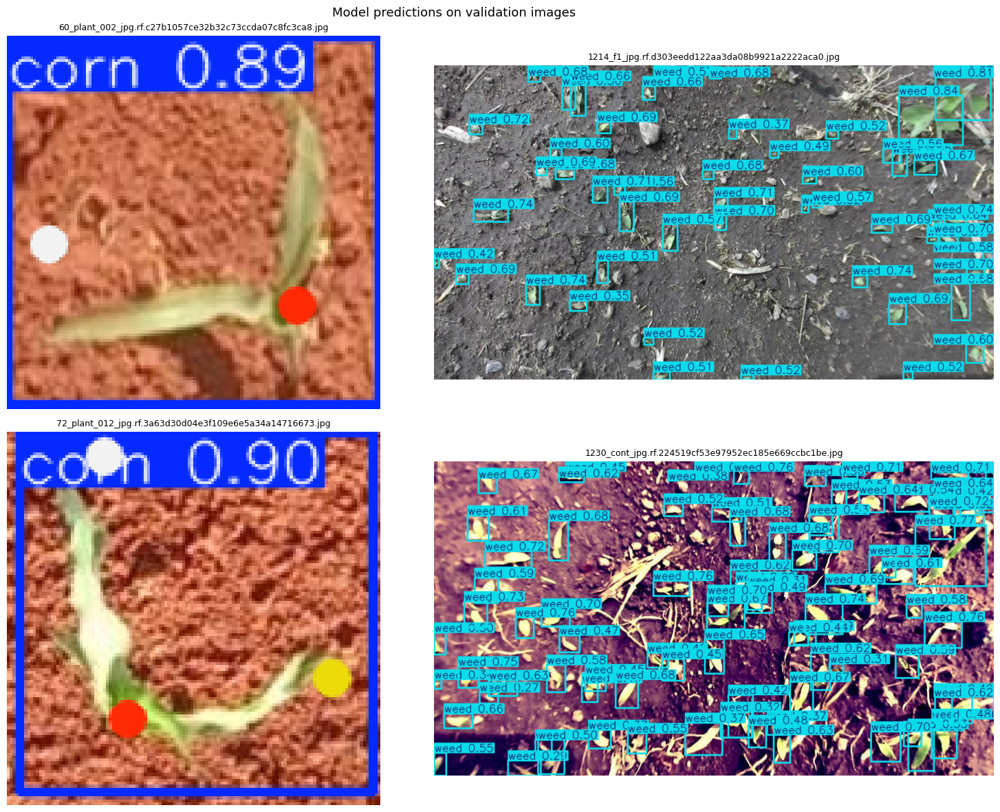

In [75]:
# Per-class breakdown — this is where you check "does it confuse weeds and corn?"
print("\nPer-class detection metrics:")
names = model.names   # {0: 'corn', 1: 'weed'}
for class_idx, class_name in names.items():
    # ap50 per class is in metrics.box.ap50 (array indexed by class)
    try:
        ap50 = metrics.box.ap50[class_idx]
        print(f"  {class_name:6s} (class {class_idx}): mAP50 = {ap50:.3f}")
    except (IndexError, TypeError):
        print(f"  {class_name:6s} (class {class_idx}): metric unavailable")

# The confusion matrix is auto-saved during val(). Print its location.
cm_path = Path(metrics.save_dir) / 'confusion_matrix.png'
print(f"\nConfusion matrix saved to: {cm_path}")
print("Open it and check the 'weed predicted as corn' cell — that's the key risk.")

# --Sanity Check--
# Look at 4 random validation images with the model's predictions drawn on.

sample_val = random.sample(val_imgs, min(4, len(val_imgs)))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
for ax, img_path in zip(axes.ravel(), sample_val):
    # model.predict returns a Results object; [0] = results for image 0 (we pass one image)
    result = model.predict(str(img_path), conf=0.25, verbose=False)[0]
    # .plot() returns a numpy array with boxes + keypoints already drawn
    annotated = result.plot(kpt_radius=6, kpt_line=True)
    ax.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    ax.set_title(img_path.name, fontsize=9)
    ax.axis('off')
plt.suptitle("Model predictions on validation images", fontsize=13)
plt.tight_layout()
plt.show()

# 6. Inference Wrapper

The raw output of model.predict() is a complex object with tensors, confidence arrays, and GPU buffers. The downstream code (row assignment, scoring) just needs a plain list of dictionaries, one per plant, with named fields.

This cell defines detect_plants(image), which returns:

```python
[
    {
        'class_id':       0,               # 0 = corn, 1 = weed
        'bbox':           [x1, y1, x2, y2],
        'confidence':     0.94,
        'stem':           (450.2, 312.1),  # or None if not confident
        'left_tip':       (420.0, 295.3),
        'right_tip':      (485.7, 301.8),
        'leaf_axis_deg':  12.5,
    },
    ...
]
```

Everything after this section uses this as its input.

In [76]:
# Confidence threshold for keypoints: below this, we treat the keypoint as "missing"
# rather than trusting a low-confidence guess. Tune based on section 5.2 results.
KP_CONF_THRESHOLD = 0.3


def axis_angle_deg(p_left, p_right):
    """
    Compute the angle of the axis through the two leaf tips.
 
    Returns angle in degrees in the range (-90, 90]:
      0 deg   = horizontal (tips are left-right)
      90 deg  = vertical   (one tip above the other)
      -45 deg = diagonal down-right
 
    Why (-90, 90] instead of (-180, 180]? Because an axis (a line) has no direction.
    An axis at +170 deg and an axis at -10 deg describe the same line.
    We normalize so downstream code doesn't have to worry about equivalent angles.
    """
    if p_left is None or p_right is None:
        return None  # can't compute an axis if either tip is missing
 
    dx = p_right[0] - p_left[0]
    dy = p_right[1] - p_left[1]
    # arctan2 gives signed angle in (-180, 180]; np.degrees converts radians to degrees
    angle = np.degrees(np.arctan2(dy, dx))
 
    # Wrap into (-90, 90] — flip by 180 deg if outside that range (same line, opposite direction)
    while angle >   90: angle -= 180
    while angle <= -90: angle += 180
    return angle
 
 
def detect_plants(image_or_path, conf=0.25, iou=0.5):
    """
    Run the trained model on one image and return a list of plant dictionaries.
 
    Parameters
    ----------
    image_or_path : str or np.ndarray
        Path to an image file, or an image array already loaded with cv2.
    conf : float
        Minimum confidence to keep a detection (0 to 1). 0.25 = keep everything that's
        25%+ likely to be a plant. Lower catches more, but with more false positives.
    iou : float
        IoU threshold for non-max suppression (merging overlapping detections).
    """
    # Run inference; [0] because predict returns a list (one per input image)
    r = model.predict(image_or_path, conf=conf, iou=iou, verbose=False)[0]
    if r.boxes is None or len(r.boxes) == 0:
        return []  # no plants detected
 
    # Pull tensors off the GPU and convert to numpy arrays for convenience
    boxes   = r.boxes.xyxy.cpu().numpy()
    confs   = r.boxes.conf.cpu().numpy()
    classes = r.boxes.cls.cpu().numpy().astype(int)   # 0 = corn, 1 = weed
    kp_xy   = r.keypoints.xy.cpu().numpy()
    # Per-keypoint confidence isn't always exposed; fall back to 1.0 if unavailable
    try:
        kp_conf = r.keypoints.conf.cpu().numpy()  # (N, 3)
    except Exception:
        kp_conf = np.ones((len(boxes), NUM_KEYPOINTS))
 
    # Build our simple list of dictionaries
    plants = []
    for i in range(len(boxes)):
 
        def kp_or_none(idx):
            """Return keypoint (x,y) tuple or None if confidence is too low."""
            if kp_conf[i, idx] < KP_CONF_THRESHOLD:
                return None
            return (float(kp_xy[i, idx, 0]), float(kp_xy[i, idx, 1]))
 
        stem  = kp_or_none(KP_STEM)
        left  = kp_or_none(KP_LEFT)
        right = kp_or_none(KP_RIGHT)
 
        # Per-leaf directional angles: vector from stem to each leaf tip.
        # Range (-180, 180]. Image coordinates (y increases downward), so
        # 0 deg points right, +90 deg down, -90 deg up, +/-180 deg left.
        # These complement leaf_axis_deg (which is direction-agnostic).
        if stem is not None and left is not None:
            left_leaf_angle_deg = float(np.degrees(np.arctan2(
                left[1] - stem[1], left[0] - stem[0])))
        else:
            left_leaf_angle_deg = None
 
        if stem is not None and right is not None:
            right_leaf_angle_deg = float(np.degrees(np.arctan2(
                right[1] - stem[1], right[0] - stem[0])))
        else:
            right_leaf_angle_deg = None
 
        plants.append({
            'class_id':             int(classes[i]),
            'bbox':                 boxes[i].tolist(),
            'confidence':           float(confs[i]),
            'stem':                 stem,
            'left_tip':             left,
            'right_tip':            right,
            'leaf_axis_deg':        axis_angle_deg(left, right),
            'left_leaf_angle_deg':  left_leaf_angle_deg,
            'right_leaf_angle_deg': right_leaf_angle_deg,
        })
    return plants
 
 
# --- Quick demo ---
demo_path = random.choice(val_imgs)
plants = detect_plants(str(demo_path))
print(f"Detected {len(plants)} plants in {demo_path.name}")
# Print the first 3 plants to confirm the structure
for p in plants[:3]:
    print(f"  conf={p['confidence']:.2f}  stem={p['stem']}  "
          f"axis={p['leaf_axis_deg']}  "
          f"L={p['left_leaf_angle_deg']}  R={p['right_leaf_angle_deg']}")
    
# ─────────────────────────────────────────────────────────────────────────────
# SANITY CHECK — keypoint plausibility for CORN only.
# Weeds carry no keypoints by design (they exist only to suppress false-positive
# corn), so their stem/tips are correctly None and are not checked here.
# ─────────────────────────────────────────────────────────────────────────────
corn = [p for p in plants if p['class_id'] == 0]
print(f"\nDetected {len(plants)} objects "
      f"({len(corn)} corn, {len(plants) - len(corn)} weed) in {demo_path.name}.")

if not corn:
    print("No corn detected in this image — nothing to sanity-check "
          "(weeds carry no keypoints). Try another demo image.")
else:
    print("Per-corn keypoint sanity:")
    for j, p in enumerate(corn):
        flags = []
        if p['stem'] is None:       flags.append("no stem")
        if p['left_tip'] is None:   flags.append("no L tip")
        if p['right_tip'] is None:  flags.append("no R tip")
        if p['stem'] and p['left_tip'] and p['right_tip']:
            mx = (p['left_tip'][0] + p['right_tip'][0]) / 2
            my = (p['left_tip'][1] + p['right_tip'][1]) / 2
            span = np.hypot(p['left_tip'][0]-p['right_tip'][0],
                            p['left_tip'][1]-p['right_tip'][1])
            off = np.hypot(p['stem'][0]-mx, p['stem'][1]-my)
            if span > 0 and off > span:
                flags.append(f"stem far from tip-midpoint ({off:.0f}px vs span {span:.0f}px)")
        status = "OK" if not flags else "CHECK: " + ", ".join(flags)
        print(f"  corn {j}: axis={p['leaf_axis_deg']}  "
              f"L={p['left_leaf_angle_deg']}  R={p['right_leaf_angle_deg']}  -> {status}")

Detected 8 plants in 0406_ver_jpg.rf.58e65d2d25a28ec7fe914faf8ce9053e.jpg
  conf=0.76  stem=None  axis=None  L=None  R=None
  conf=0.75  stem=None  axis=None  L=None  R=None
  conf=0.75  stem=None  axis=None  L=None  R=None

Detected 8 objects (0 corn, 8 weed) in 0406_ver_jpg.rf.58e65d2d25a28ec7fe914faf8ce9053e.jpg.
No corn detected in this image — nothing to sanity-check (weeds carry no keypoints). Try another demo image.


---
# 7. Row Identity Helper

When we went out to take field photos, we walked down one row at a time with a phone camera. Row identity is something we knew at the time of taking the photo, not something that needs to be figured out afterward. The simplest way to preserve that information is to just put the photos in the right folder when transferring them off your phone.

Expected folder layout:
field_photos/
├── row_0/
│   ├── plant_a.jpg
│   ├── plant_b.jpg
│   └── ...        (all photos of row 0)
├── row_1/
│   └── ...        (all photos of row 1)
├── row_2/
│   └── ...
...
```
Every image inside row_N/ belongs to row N. No clustering, no GPS, no guessing. Photos are assigned to rows in file order, 5 photos per row by default. If 6 to 9 photos are left over at the end they stay together as one final row rather than getting split into 5 plus a tiny leftover group. A small helper then walks this folder structure and yields (row_id, image_path) pairs in file order, which feed into section 8 for fitting the reference line per row and section 9 for scoring each plant against it.

In [77]:
import re

FIELD_DATE_DIRS = ("corn2mei", "corn8mei", "corn14mei")

PHOTOS_PER_ROW = 5
MIN_TAIL = 10

IMG_EXTS = {'.jpg', '.jpeg', '.png'}
FIELD_PHOTOS_ROOT = PROJECT_ROOT

def _natural_photo_key(path):
    """
    Natural filename order, with WhatsApp-style duplicate suffixes ordered as:
    name.jpeg, name (1).jpeg, name (2).jpeg, ..., name (10).jpeg
    """
    path = Path(path)
    stem = path.stem.lower()

    m = re.match(r"^(.*?)(?:\s+\((\d+)\))?$", stem)
    base = m.group(1) if m else stem
    suffix_num = int(m.group(2)) if (m and m.group(2)) else 0

    base_parts = [
        int(part) if part.isdigit() else part
        for part in re.split(r"(\d+)", base)
    ]
    return base_parts + [suffix_num, path.suffix.lower()]


def walk_group_photos(group_dir):
    """Yield image paths inside one control/ or experiment/ folder in walking/file order."""
    paths = [
        p for p in Path(group_dir).iterdir()
        if p.is_file() and p.suffix.lower() in IMG_EXTS
    ]
    for img_path in sorted(paths, key=_natural_photo_key):
        yield img_path


def discover_field_groups(field_root):
    """
    Find only the intended field-photo folders:
    corn2mei/control, corn2mei/experiment,
    corn8mei/control, corn8mei/experiment,
    corn14mei/control, corn14mei/experiment.
    """
    field_root = Path(field_root)
    if not field_root.exists():
        raise FileNotFoundError(f"Field photos folder not found: {field_root}")

    groups = []
    for date_name in FIELD_DATE_DIRS:
        date_dir = field_root / date_name
        if not date_dir.exists():
            continue
        for group in ("control", "experiment"):
            gdir = date_dir / group
            if gdir.exists():
                groups.append((date_name, group, gdir))

    if not groups:
        raise ValueError(
            f"No field photo groups found under {field_root}. Expected "
            "corn2mei/corn8mei/corn14mei with control/ and experiment/ subfolders."
        )
    return groups


def assign_rows_by_photo_order(photo_paths, photos_per_row=PHOTOS_PER_ROW, min_tail=MIN_TAIL):
    """
    Split ordered photos into rows of 5.

    If 6-9 photos remain, keep them together as one final row instead of
    splitting them into 5 + a tiny leftover row.
    """
    photos = list(photo_paths)
    assign = {}

    row = 0
    idx = 0
    n = len(photos)

    while idx < n:
        remaining = n - idx
        take = remaining if remaining < min_tail else photos_per_row

        for img_path in photos[idx:idx + take]:
            assign[img_path] = row

        idx += take
        row += 1

    return assign

# --- Quick sanity-check: list what we found and how rows will be split ---
if FIELD_PHOTOS_ROOT.exists():
    from collections import Counter

    print(f"Field photos root: {FIELD_PHOTOS_ROOT}\n")
    print(f"Using rows of {PHOTOS_PER_ROW} photos.")
    print(f"If {PHOTOS_PER_ROW + 1}-{MIN_TAIL - 1} photos remain, they stay together as one final row.\n")

    for date, group, gdir in discover_field_groups(FIELD_PHOTOS_ROOT):
        paths = list(walk_group_photos(gdir))
        photo_to_row = assign_rows_by_photo_order(paths)

        n_rows = (max(photo_to_row.values()) + 1) if photo_to_row else 0
        per_row = Counter(photo_to_row.values())
        sizes = [per_row[r] for r in range(n_rows)]

        print(f"  {date:12s} / {group:10s}  ->  {len(paths):3d} photos  "
              f"->  {n_rows} rows  {sizes}")

        for r in range(n_rows):
            row_files = [p.name for p in paths if photo_to_row[p] == r]
            first_file = row_files[0] if row_files else "-"
            last_file = row_files[-1] if row_files else "-"
            print(f"      r{r}: {len(row_files):2d} photos  {first_file}  ->  {last_file}")
else:
    print(f"No field photos folder yet at {FIELD_PHOTOS_ROOT}.")
    print("Expected: <root>/<date>/control and <root>/<date>/experiment.")


Field photos root: C:\Users\atpou\projects\alecs_draft\alecs_draft

Using rows of 5 photos.
If 6-9 photos remain, they stay together as one final row.

  corn2mei     / control     ->   15 photos  ->  3 rows  [5, 5, 5]
      r0:  5 photos  IMG_20260502_171417.jpg  ->  IMG_20260502_171459.jpg
      r1:  5 photos  IMG_20260502_171502.jpg  ->  IMG_20260502_171516.jpg
      r2:  5 photos  IMG_20260502_171536.jpg  ->  IMG_20260502_171547.jpg
  corn2mei     / experiment  ->   28 photos  ->  5 rows  [5, 5, 5, 5, 8]
      r0:  5 photos  IMG_20260502_170932.jpg  ->  IMG_20260502_171025.jpg
      r1:  5 photos  IMG_20260502_171029.jpg  ->  IMG_20260502_171128.jpg
      r2:  5 photos  IMG_20260502_171134.jpg  ->  IMG_20260502_171248.jpg
      r3:  5 photos  IMG_20260502_171253.jpg  ->  IMG_20260502_171306.jpg
      r4:  8 photos  IMG_20260502_171309.jpg  ->  IMG_20260502_171404.jpg
  corn8mei     / control     ->   18 photos  ->  3 rows  [5, 5, 8]
      r0:  5 photos  WhatsApp Image 2026-05-11 at

# 8. Optimal Line Calculation

In our greenhouse trial the seeds were deliberately hand-planted along straight perpendicular lines. The optimal line is the row they were supposed to land on.

## Two ways to supply the optimal line

1. If you know exactly where the rows were planted (from the physical layout or a marking visible in the image), use OptimalLine.from_point_angle() and hard-code the values. This is the most accurate approach.

2. If you do not know, fit a line through the detected stems using RANSAC (Random Sample Consensus). Unlike ordinary least-squares, RANSAC ignores outliers. In this context the outliers are the plants that ended up far off the row, and those are exactly what we want to score poorly rather than absorb into the reference line.

In [78]:
from dataclasses import dataclass
from sklearn.linear_model import RANSACRegressor

def angular_diff_deg(a, b):
    """
    Smallest unsigned difference between two axis angles, normalized to [0, 90].

    Because an axis has no direction (line, not arrow), 170 deg and -10 deg describe
    the same axis, and their difference should be 0.
    """
    if a is None or b is None:
        return None
    d = abs(a - b) % 180
    return min(d, 180 - d)

def directional_angle_diff_deg(a, b):
    """
    Smallest *directional* difference between two vectors, in degrees, in [0, 180].

    Unlike angular_diff_deg (which wraps mod 180 and treats opposite directions as
    equal), this wraps mod 360, so a vector and its 180-deg opposite differ by 180.
    Used for the per-leaf deviations (report eqs. IV.7 / IV.8), which are directional.
    """
    if a is None or b is None:
        return None
    return abs((a - b + 180) % 360 - 180)

@dataclass
class OptimalLine:
    """
    Represents a line in image coordinates as a point + unit direction vector.

    Why store it this way instead of slope + intercept? Because slope-intercept
    breaks down for vertical lines (infinite slope). Point + direction works for
    any line orientation.

    Attributes
    ----------
    px, py : float
        A point on the line, in image pixels.
    dx, dy : float
        The direction vector of the line (unit length: dx*dx + dy*dy = 1).
    """
    px: float
    py: float
    dx: float
    dy: float

    @classmethod
    def from_point_angle(cls, px, py, angle_deg):
        """Construct a line from a point and an angle in degrees."""
        t = np.radians(angle_deg)
        return cls(px, py, np.cos(t), np.sin(t))

    @classmethod
    def from_ransac(cls, stems_xy, residual_threshold=15.0, random_state=SEED):
        """
        Fit a line to a cloud of stem (x, y) points using RANSAC.

        residual_threshold (in pixels) = how far from the line a point can be
        while still counting as an inlier. Set this to your planting tolerance.
        """
        stems = np.asarray(stems_xy)
        if len(stems) < 2:
            # Degenerate — only one point; return a horizontal line through it
            return cls(stems[0, 0], stems[0, 1], 1.0, 0.0)

        X, y = stems[:, 0:1], stems[:, 1]

        # Detect near-vertical rows and handle them separately.
        # A near-vertical row has very little x-spread — fitting y(x) is unstable.
        # We fit x(y) instead and then flip the result back.
        if X.std() < y.std() * 0.2:
            # Near-vertical case: regress x on y
            ry = RANSACRegressor(residual_threshold=residual_threshold,
                                 random_state=random_state).fit(stems[:, 1:2], stems[:, 0])
            m = ry.estimator_.coef_[0]     # slope of x = m*y + c
            c = ry.estimator_.intercept_   # intercept
            n = np.hypot(m, 1)              # magnitude for normalization
            # Direction vector (m, 1) normalized; passes through (c, 0)
            return cls(c, 0.0, m / n, 1.0 / n)
        else:
            # Normal case: regress y on x
            rx = RANSACRegressor(residual_threshold=residual_threshold,
                                 random_state=random_state).fit(X, y)
            m = rx.estimator_.coef_[0]      # slope of y = m*x + c
            c = rx.estimator_.intercept_
            n = np.hypot(1, m)
            # Direction vector (1, m) normalized; passes through (0, c)
            return cls(0.0, c, 1.0 / n, m / n)

    @classmethod
    def from_points_tls(cls, points):
        """
        Total-least-squares line through ALL given points (no outlier rejection).

        Unlike from_ransac, this uses *every* plant in the row to decide the line:
        the direction is the principal eigenvector of the centered stem cloud, and
        the line passes through the centroid. This is the right choice when we want
        the seeding line to account for all plants in the row (both the carefully
        planted control rows and the scattered experiment rows), rather than
        following an inlier majority and discarding the rest.
        """
        P = np.asarray(points, dtype=float)
        if len(P) < 2:
            return cls(P[0, 0], P[0, 1], 1.0, 0.0)
        centroid = P.mean(axis=0)
        cov = np.cov((P - centroid).T)
        evals, evecs = np.linalg.eigh(cov)
        d = evecs[:, -1]                       # largest-eigenvalue dir = line direction
        norm = np.hypot(d[0], d[1]) or 1.0
        return cls(centroid[0], centroid[1], d[0] / norm, d[1] / norm)

    def perpendicular_distance(self, pt):
        """
        Signed perpendicular distance from a point to the line, in pixels.

        Uses the 2D cross-product formula:
          distance = (pt - P) x direction
        where x is the scalar cross product (positive = left of line, negative = right).

        We usually take the absolute value for scoring.
        """
        vx, vy = pt[0] - self.px, pt[1] - self.py
        return vx * self.dy - vy * self.dx
    
    @classmethod
    def from_points_near_vertical(cls, points, max_tilt_from_vertical_deg=15):
        """
        Fit a row line that is allowed to lean slightly, but is constrained to stay
        near vertical in the image.

        This avoids the bad TLS behavior where unrelated cross-photo y placement
        rotates the row line diagonally.
        """
        P = np.asarray(points, dtype=float)
        P = P[np.isfinite(P).all(axis=1)]

        if len(P) == 0:
            raise ValueError("Cannot fit a row line with no valid stem points.")

        median_x = float(np.median(P[:, 0]))
        median_y = float(np.median(P[:, 1]))

        if len(P) < 3:
            return cls.from_point_angle(median_x, median_y, 90)

        y = P[:, 1]
        x = P[:, 0]

        # Robust slope estimate for x = a*y + b.
        slopes = []
        for i in range(len(P)):
            for j in range(i + 1, len(P)):
                dy = y[j] - y[i]
                if abs(dy) < 1e-6:
                    continue
                slopes.append((x[j] - x[i]) / dy)

        if not slopes:
            return cls.from_point_angle(median_x, median_y, 90)

        a = float(np.median(slopes))

        max_a = np.tan(np.radians(max_tilt_from_vertical_deg))
        a = float(np.clip(a, -max_a, max_a))

        b = float(np.median(x - a * y))

        # x = a*y + b has direction vector (a, 1).
        norm = np.hypot(a, 1.0)
        px = a * median_y + b
        py = median_y

        return cls(px, py, a / norm, 1.0 / norm)
    
    def angle_deg(self):
        """Return the angle of the line in degrees, normalized to (-90, 90]."""
        a = np.degrees(np.arctan2(self.dy, self.dx))
        while a >   90: a -= 180
        while a <= -90: a += 180
        return a

# 9. Alignment Scores and Deviations

## Per-plant deviations

Two numbers per plant:

- **Positional deviation**: perpendicular pixel distance from the stem to the row's reference line. Directly answers how far off the plant is from where it was supposed to be.
- **Angular deviation**: how far the plant's leaf axis is from the expected orientation. In our trial leaves should grow across the row, so the expected leaf axis is 90 degrees off from the row direction (EXPECTED_LEAF_OFFSET_DEG = 90).

## Per-plant score (0 to 100, higher is better)
pos_score(d)     = 100 x exp(-d / POS_TOLERANCE_PX)
ang_score(delta) = 100 x max(0, 1 - delta / ANG_TOLERANCE_DEG)
plant_score      = 0.5 x pos_score + 0.5 x ang_score

Positional score uses exponential decay because a plant 60 px off is not just twice as bad as one 30 px off, it is qualitatively wrong. Exponential decay reflects that. Angular score uses a linear decay with a hard floor at zero because 90 degrees off means completely sideways, and it makes sense to call that a zero.

## Per-row score

Average the plant scores in each row. We also report what fraction of plants are within tolerance, which is the number a farmer would actually want to know: for example, 85% of plants in row 3 are within spec.

## Tuning

The two constants below control how strict scoring is. Set them based on what counts as acceptable planting error for the specific use case, not based on what the model can achieve.

In [79]:
# --- Scoring thresholds — tune these based on real-world planting tolerance ---
POS_TOLERANCE_PX  = 30.0      # pixel offset at which positional score drops to ~37/100 (1/e)
ANG_TOLERANCE_DEG = 20.0      # angle offset at which angular score hits 0/100
EXPECTED_LEAF_OFFSET_DEG = 90.0  # leaves grow across (perpendicular to) the row

def score_plants(plants, optimal_lines,
                 pos_tol=POS_TOLERANCE_PX,
                 ang_tol=ANG_TOLERANCE_DEG,
                 expected_offset=EXPECTED_LEAF_OFFSET_DEG):
    """
    Add scoring fields to each plant dict:
      pos_dev_px, ang_dev_deg, pos_score, ang_score, plant_score
      left_leaf_dev_deg, right_leaf_dev_deg   (per-leaf deviation extension)
    """
    for p in plants:
        rid = p['row_id']
        # Can't score plants with no row assignment or no stem
        if rid < 0 or rid not in optimal_lines or p['stem'] is None:
            p.update(dict(pos_dev_px=None, ang_dev_deg=None,
                          pos_score=None, ang_score=None, plant_score=None,
                          left_leaf_dev_deg=None, right_leaf_dev_deg=None))
            continue
 
        line = optimal_lines[rid]
 
        # --- Positional deviation ---
        pos_dev = abs(line.perpendicular_distance(p['stem']))  # perpendicular distance, pixels
        p['pos_dev_px'] = pos_dev
        # Exponential decay: 100 at d=0, ~37 at d=pos_tol, ~14 at d=2*pos_tol
        p['pos_score']  = 100.0 * np.exp(-pos_dev / pos_tol)
 
        # --- Angular deviation (whole leaf axis vs expected) ---
        if p['leaf_axis_deg'] is not None:
            # Expected leaf axis = row direction + 90 deg (perpendicular)
            expected_axis_deg = line.angle_deg() + expected_offset
            # Normalize expected axis to (-90, 90]
            while expected_axis_deg >   90: expected_axis_deg -= 180
            while expected_axis_deg <= -90: expected_axis_deg += 180
 
            ang_dev = angular_diff_deg(p['leaf_axis_deg'], expected_axis_deg)
            p['ang_dev_deg'] = ang_dev
            # Linear decay: 100 at dev=0, 0 at dev=ang_tol, still 0 beyond
            p['ang_score']   = 100.0 * max(0.0, 1.0 - ang_dev / ang_tol)
        else:
            p['ang_dev_deg'] = None
            p['ang_score']   = None
 
        # --- Per-leaf deviations (report eqs. IV.7 / IV.8) ---
        # Angle of each leaf measured from ITS OWN expected perpendicular direction:
        # the left leaf vs the left perpendicular, the right leaf vs the right
        # perpendicular (the two are 180 deg apart, eqs. IV.5 / IV.6). We take the
        # magnitude of the signed difference (mod-360 wrap), so the value is the same
        # whether the leaf sits 10 deg above or 10 deg below the expected direction
        # (both -> 10), but a leaf FOLDED backward reads the large "outside" angle
        # (up to 180 deg), which distinguishes folding from a mild tilt.
        # Descriptive only; these do not feed plant_score.
        expected_left_leaf_deg  = line.angle_deg() + expected_offset          # IV.5
        expected_right_leaf_deg = expected_left_leaf_deg + 180                # IV.6
        if p.get('left_leaf_angle_deg') is not None:
            p['left_leaf_dev_deg']  = directional_angle_diff_deg(
                p['left_leaf_angle_deg'],  expected_left_leaf_deg)
        else:
            p['left_leaf_dev_deg']  = None
        if p.get('right_leaf_angle_deg') is not None:
            p['right_leaf_dev_deg'] = directional_angle_diff_deg(
                p['right_leaf_angle_deg'], expected_right_leaf_deg)
        else:
            p['right_leaf_dev_deg'] = None 
 
        # --- Combined score (unchanged from axis-only version) ---
        if p['ang_score'] is not None:
            p['plant_score'] = 0.5 * p['pos_score'] + 0.5 * p['ang_score']
        else:
            # If we couldn't compute angular (e.g., one leaf tip missing),
            # fall back to positional only
            p['plant_score'] = p['pos_score']
    return plants
 
 
def row_scores(plants):
    """
    Roll plant-level scores up to per-row summaries.
 
    For each row, returns:
      n              — number of plants
      mean_score     — average plant_score across the row
      mean_pos_px    — average positional deviation
      max_pos_px     — worst positional deviation (useful for spotting bad plants)
      mean_ang_deg   — average angular deviation
      within_tol_pct — fraction of plants within POS_TOLERANCE_PX
    """
    # Group plants by row
    rows = defaultdict(list)
    for p in plants:
        if p['row_id'] >= 0 and p['plant_score'] is not None:
            rows[p['row_id']].append(p)
 
    summary = {}
    for rid, plist in rows.items():
        pos_devs = [p['pos_dev_px']  for p in plist if p['pos_dev_px']  is not None]
        ang_devs = [p['ang_dev_deg'] for p in plist if p['ang_dev_deg'] is not None]
        scores   = [p['plant_score'] for p in plist]
        within   = sum(1 for d in pos_devs if d <= POS_TOLERANCE_PX) / max(1, len(pos_devs))
 
        summary[rid] = dict(
            n=len(plist),
            mean_score=float(np.mean(scores)),
            mean_pos_px=float(np.mean(pos_devs)) if pos_devs else None,
            max_pos_px=float(np.max(pos_devs)) if pos_devs else None,
            mean_ang_deg=float(np.mean(ang_devs)) if ang_devs else None,
            within_tol_pct=100.0 * within,
        )
    return summary

# ─────────────────────────────────────────────────────────────────────────────
# SANITY CHECK (geometry only — no model/photos needed). Confirms the per-leaf
# deviation = angle of each leaf from ITS expected perpendicular direction.
# Same value 10 deg above or below the expected line; a FOLDED-back leaf gives
# the large "outside" angle (up to 180). Range [0, 180].
# ─────────────────────────────────────────────────────────────────────────────
print("="*64)
print("Per-leaf deviation = angle from the expected perpendicular direction")
print("="*64)
_perp = 0.0   # work in the expected perpendicular's own frame (its '0' line)
print(f"{'leaf vs expected':>18} {'deviation':>10}")
for _th in [0, 10, -10, 45, -45, 90, -90, 170, -170, 180]:
    print(f"{_th:>18} {directional_angle_diff_deg(_th, _perp):>10.1f}")
print("\nChecks:")
print("  +10 and -10 (tilt above/below) both ->",
      directional_angle_diff_deg(10,_perp), "/", directional_angle_diff_deg(-10,_perp))
print("  +170 / -170 (folded back) -> large outside angle:",
      directional_angle_diff_deg(170,_perp), "/", directional_angle_diff_deg(-170,_perp))


Per-leaf deviation = angle from the expected perpendicular direction
  leaf vs expected  deviation
                 0        0.0
                10       10.0
               -10       10.0
                45       45.0
               -45       45.0
                90       90.0
               -90       90.0
               170      170.0
              -170      170.0
               180      180.0

Checks:
  +10 and -10 (tilt above/below) both -> 10.0 / 10.0
  +170 / -170 (folded back) -> large outside angle: 170.0 / 170.0


# 10. Running the Pipeline

This section runs the full pipeline on every photo in field_photos/. For each row:

1. Detect plants in every photo of that row using detect_plants() from section 6.
2. Collect all stem positions into one list per row.
3. Fit one reference line per row using all those stems (OptimalLine from section 8).
4. Score every plant against that row's line using score_plants() from section 9.

Two CSVs are written:

- **plants.csv**: one row per detected plant, with image name, row, position, deviations, and score.
- **rows.csv**: one row per row, with plant count, mean score, mean and max positional deviation, mean angular deviation, and percentage within tolerance.

A visualization is also produced for a sample photo from each row, color-coded by score (green = well aligned, red = off).

## Why we fit the line across all photos in a row, not per photo

A single field photo usually has 1-3 plants in it, which is not enough to reliably define a straight line. By pooling all stems from all photos in a given row, there are enough points that RANSAC can do its job properly and a few outlier plants cannot drag the reference line toward themselves.

In [80]:
def _angle_deg_from_points(a, b):
    """Angle from point a to point b in image coordinates."""
    return float(np.degrees(np.arctan2(b[1] - a[1], b[0] - a[0])))


def _point_from_angle(center, angle_deg, radius):
    """Point at angle/radius from center, using image coordinates."""
    a = np.radians(angle_deg)
    return (int(center[0] + radius * np.cos(a)),
            int(center[1] + radius * np.sin(a)))


def _draw_dashed_line(img, p1, p2, color, thickness, dash_len, gap_len):
    """Draw a dashed line segment."""
    p1 = np.array(p1, dtype=float); p2 = np.array(p2, dtype=float)
    dist = np.linalg.norm(p2 - p1)
    if dist == 0:
        return
    direction = (p2 - p1) / dist
    t = 0
    while t < dist:
        a = p1 + direction * t
        b = p1 + direction * min(t + dash_len, dist)
        cv2.line(img, tuple(a.astype(int)), tuple(b.astype(int)),
                 color, thickness, cv2.LINE_AA)
        t += dash_len + gap_len


def _draw_angle_arc(img, center, from_angle, to_angle, radius, color, thickness):
    """Draw the directional arc from the expected vector to the actual vector."""
    diff = (to_angle - from_angle + 180) % 360 - 180
    steps = max(8, int(abs(diff) / 3))
    arc_angles = np.linspace(from_angle, from_angle + diff, steps)
    pts = [_point_from_angle(center, a, radius) for a in arc_angles]
    if len(pts) >= 2:
        cv2.polylines(img, [np.array(pts, dtype=np.int32)],
                      False, color, thickness, cv2.LINE_AA)


def _label(img, text, org, color, scale, thick, anchor="left"):
    """Draw readable text, clamped inside the image."""
    H, W = img.shape[:2]
    (tw, th), base = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, scale, thick)

    x, y = int(org[0]), int(org[1])
    if anchor == "center":
        x -= tw // 2
    elif anchor == "right":
        x -= tw

    x = int(np.clip(x, 2, max(2, W - tw - 2)))
    y = int(np.clip(y, th + 2, max(th + 2, H - base - 2)))

    cv2.putText(img, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX, scale,
                (0, 0, 0), thick + max(2, thick), cv2.LINE_AA)
    cv2.putText(img, text, (x, y), cv2.FONT_HERSHEY_SIMPLEX, scale,
                color, thick, cv2.LINE_AA)


def _draw_leaf_angle_geometry(out, p, line, color, S):
    if line is None or not (p.get('stem') and p.get('left_tip') and p.get('right_tip')):
        return

    x1, y1, x2, y2 = map(int, p['bbox'])
    stem = tuple(map(int, p['stem']))
    left = tuple(map(int, p['left_tip']))
    right = tuple(map(int, p['right_tip']))

    expected_left = line.angle_deg() + EXPECTED_LEAF_OFFSET_DEG
    expected_right = expected_left + 180
    leaf_len = max(int(0.5 * max(x2 - x1, y2 - y1)), 6 * S)

    line_th = max(2, S)
    dash_th = max(2, S)
    dot_r = max(3, 2 * S)
    font = 0.45 * S
    font_th = max(2, S)

    _draw_dashed_line(out, stem, _point_from_angle(stem, expected_left, leaf_len),
                      (255, 255, 255), dash_th, 6 * S, 4 * S)
    _draw_dashed_line(out, stem, _point_from_angle(stem, expected_right, leaf_len),
                      (255, 255, 255), dash_th, 6 * S, 4 * S)

    left_color = (255, 170, 0)
    right_color = (0, 200, 255)

    cv2.line(out, stem, left, left_color, line_th + 1, cv2.LINE_AA)
    cv2.line(out, stem, right, right_color, line_th + 1, cv2.LINE_AA)
    cv2.circle(out, left, dot_r, left_color, -1)
    cv2.circle(out, right, dot_r, right_color, -1)
    cv2.circle(out, stem, dot_r, (255, 255, 255), -1)

    left_angle = _angle_deg_from_points(stem, left)
    right_angle = _angle_deg_from_points(stem, right)

    # Put L/R labels just beyond the leaf tips, away from the stem.
    for label, tip, tip_angle, tip_color in [
        ("L", left, left_angle, left_color),
        ("R", right, right_angle, right_color),
    ]:
        pos = _point_from_angle(tip, tip_angle, 7 * S)
        _label(out, label, pos, tip_color, font, font_th, anchor="center")

    arc_radius = max(int(0.22 * max(x2 - x1, y2 - y1)), 4 * S)
    _draw_angle_arc(out, stem, expected_left, left_angle, arc_radius, left_color, line_th)
    _draw_angle_arc(out, stem, expected_right, right_angle, arc_radius + 3 * S, right_color, line_th)

    ld = p.get('left_leaf_dev_deg')
    rd = p.get('right_leaf_dev_deg')

    if ld is not None:
        m = _point_from_angle(stem, expected_left + ((left_angle - expected_left + 180) % 360 - 180) / 2,
                              arc_radius + 8 * S)
        _label(out, f"{ld:.0f}", m, left_color, font, font_th, anchor="center")

    if rd is not None:
        m = _point_from_angle(stem, expected_right + ((right_angle - expected_right + 180) % 360 - 180) / 2,
                              arc_radius + 11 * S)
        _label(out, f"{rd:.0f}", m, right_color, font, font_th, anchor="center")


def visualize_alignment(img_bgr, plants, optimal_lines):
    H, W = img_bgr.shape[:2]
    out = img_bgr.copy()

    S = max(2, int(round(max(W, H) / 500.0)))
    line_th = max(2, S)
    font = 0.5 * S
    font_th = max(2, S)

    for rid, line in optimal_lines.items():
        t_vals = np.linspace(-max(W, H), max(W, H), 2)
        xs = line.px + t_vals * line.dx
        ys = line.py + t_vals * line.dy
        p0 = (int(xs[0]), int(ys[0]))
        p1 = (int(xs[1]), int(ys[1]))

        cv2.line(out, p0, p1, (255, 255, 255), line_th + 1, cv2.LINE_AA)
        _label(out, "ROW", (int(line.px) + 5 * S, int(line.py) - 5 * S),
               (255, 255, 255), font, font_th)

    default_line = next(iter(optimal_lines.values())) if optimal_lines else None

    for p in plants:
        if p['stem'] is None:
            continue

        line = optimal_lines.get(p.get('row_id'), default_line)
        score = p['plant_score'] if p['plant_score'] is not None else 0

        g = int(np.clip(score * 2.55, 0, 255))
        r = int(np.clip((100 - score) * 2.55, 0, 255))
        color = (0, g, r)

        x1, y1, x2, y2 = map(int, p['bbox'])
        cv2.rectangle(out, (x1, y1), (x2, y2), color, line_th + 1)

        if p['left_tip'] and p['right_tip']:
            lx, ly = map(int, p['left_tip'])
            rx, ry = map(int, p['right_tip'])
            cv2.line(out, (lx, ly), (rx, ry), color, line_th, cv2.LINE_AA)

        _draw_leaf_angle_geometry(out, p, line, color, S)

        if p['plant_score'] is not None:
            score_y = y1 - 5 * S if y1 > 14 * S else y1 + 12 * S
            _label(out, f"score {p['plant_score']:.0f}", (x1 + 2 * S, score_y),
                   color, font, font_th)

    _label(out, "L/R = left/right leaf   dashed = expected   number = deviation deg",
           (4 * S, H - 4 * S), (255, 255, 255), 0.42 * S, max(2, S))

    return out

Pass 1: detecting corn in all field photos...
  corn2mei/control: 13 corn detections in 15 photos
  corn2mei/experiment: 26 corn detections in 28 photos
  corn8mei/control: 21 corn detections in 18 photos
  corn8mei/experiment: 46 corn detections in 41 photos
  corn14mei/control: 16 corn detections in 17 photos
  corn14mei/experiment: 34 corn detections in 32 photos

Pass 2: forming rows by file order and fitting a line per row...
  corn14mei__control__r0: 5 plants from 5 photos, 5 stems, -75.0deg
  corn14mei__control__r1: 3 plants from 5 photos, 3 stems, -82.5deg
  corn14mei__control__r2: 8 plants from 7 photos, 7 stems, -75.0deg
  corn14mei__experiment__r0: 7 plants from 5 photos, 6 stems, +80.8deg
  corn14mei__experiment__r1: 4 plants from 5 photos, 3 stems, +75.0deg
  corn14mei__experiment__r2: 5 plants from 5 photos, 5 stems, -81.5deg
  corn14mei__experiment__r3: 5 plants from 5 photos, 5 stems, -79.8deg
  corn14mei__experiment__r4: 5 plants from 5 photos, 5 stems, -75.0deg
  corn

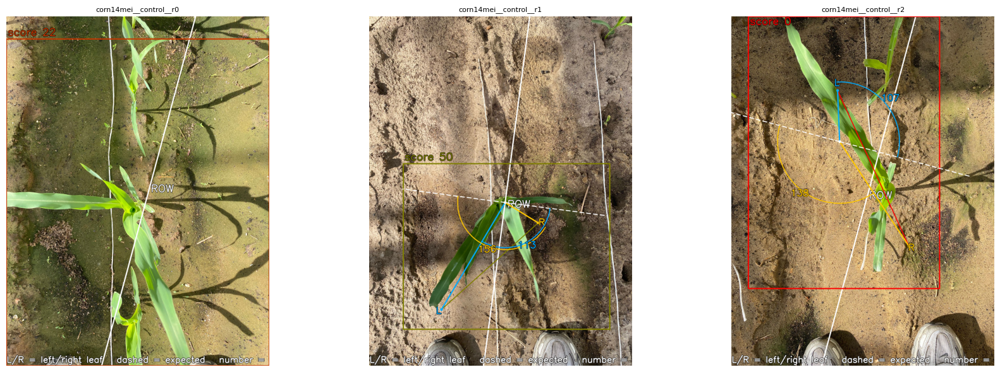

In [81]:
import csv  # standard library CSV writer

OUT_DIR = PROJECT_ROOT / 'results'
OUT_DIR.mkdir(exist_ok=True)
plant_csv = OUT_DIR / 'plants.csv'
row_csv   = OUT_DIR / 'rows.csv'

# A unique key per scored row: "<date>__<group>__r<local_row>"
plant_header = ['image', 'date', 'group', 'row_key', 'local_row',
                'x1', 'y1', 'x2', 'y2', 'conf',
                'stem_x', 'stem_y', 'left_x', 'left_y', 'right_x', 'right_y',
                'leaf_axis_deg', 'pos_dev_px', 'ang_dev_deg',
                'pos_score', 'ang_score', 'plant_score',
                'left_leaf_angle_deg', 'right_leaf_angle_deg',
                'left_leaf_dev_deg',   'right_leaf_dev_deg']
row_header = ['row_key', 'date', 'group', 'local_row', 'n_plants', 'mean_score',
              'mean_pos_px', 'max_pos_px', 'mean_ang_deg', 'within_tol_pct',
              'line_angle_deg']

if not FIELD_PHOTOS_ROOT.exists():
    raise FileNotFoundError(
        f"Field photos not found at {FIELD_PHOTOS_ROOT}. Expected "
        "alecs_draft/<date>/control and alecs_draft/<date>/experiment."
    )

# ── Pass 1: detect corn per photo, keeping photos grouped & ORDERED ───────────
print("Pass 1: detecting corn in all field photos...")
# (date, group) -> ordered list of (image_path, [corn plants in that photo])
group_photos = defaultdict(list)
for date, group, gdir in discover_field_groups(FIELD_PHOTOS_ROOT):
    n_corn = 0
    for img_path in walk_group_photos(gdir):     # sorted = file order
        corn = [p for p in detect_plants(str(img_path)) if p['class_id'] == 0]
        group_photos[(date, group)].append((img_path, corn))
        n_corn += len(corn)
    print(f"  {date}/{group}: {n_corn} corn detections in "
          f"{len(group_photos[(date, group)])} photos")

# ── Pass 2: split photos into rows of PHOTOS_PER_ROW (file order), fit a line ──
print("\nPass 2: forming rows by file order and fitting a line per row...")
# row_key -> dict(date, group, local_row, line, observations=[(img, plant)])
row_data = {}
for (date, group), photos in sorted(group_photos.items()):
    ordered_paths = [ip for ip, _ in photos]
    photo_to_row = assign_rows_by_photo_order(ordered_paths)
    n_rows = (max(photo_to_row.values()) + 1) if photo_to_row else 0

    for r in range(n_rows):
        sub = [(ip, p) for ip, corn in photos if photo_to_row.get(ip) == r
               for p in corn]
        if not sub:
            continue
        row_key = f"{date}__{group}__r{r}"
        stems = [p['stem'] for _, p in sub if p.get('stem')]
        line = None
        if len(stems) >= 2:
            try:
                # Fit the seeding line through ALL stems of this row (total least
                # squares), so every plant informs it.
                line = OptimalLine.from_points_near_vertical(stems, max_tilt_from_vertical_deg=15)
            except Exception as e:
                print(f"  {row_key}: line fit failed — {e}")
        row_data[row_key] = dict(date=date, group=group, local_row=r,
                                 line=line, observations=sub)
        n_photos_here = sum(1 for ip in ordered_paths if photo_to_row.get(ip) == r)
        angle = f"{line.angle_deg():+.1f}deg" if line else "no line"
        print(f"  {row_key}: {len(sub)} plants from {n_photos_here} photos, "
              f"{len(stems)} stems, {angle}")

# ── Pass 3: score every plant against its row's line and write CSVs ───────────
print("\nPass 3: scoring and writing CSVs...")
with open(plant_csv, 'w', newline='') as fp, open(row_csv, 'w', newline='') as fr:
    pw = csv.writer(fp); pw.writerow(plant_header)
    rw = csv.writer(fr); rw.writerow(row_header)

    for row_key, rd in sorted(row_data.items()):
        line = rd['line']
        obs  = rd['observations']
        plants = [p for _, p in obs]

        # score_plants keys on p['row_id']; give every plant this row's id (0)
        # and pass a single-line dict. If no line could be fit, skip scoring.
        if line is None:
            for _, p in obs:
                p.update(dict(row_id=-1, pos_dev_px=None, ang_dev_deg=None,
                              pos_score=None, ang_score=None, plant_score=None,
                              left_leaf_dev_deg=None, right_leaf_dev_deg=None))
        else:
            for p in plants:
                p['row_id'] = 0
            score_plants(plants, {0: line})

        # per-plant rows
        for (img_path, _), p in zip(obs, plants):
            pw.writerow([
                img_path.name, rd['date'], rd['group'], row_key, rd['local_row'],
                *[f"{v:.1f}" for v in p['bbox']], f"{p['confidence']:.3f}",
                *(f"{v:.1f}" for v in (p['stem']      or (np.nan, np.nan))),
                *(f"{v:.1f}" for v in (p['left_tip']  or (np.nan, np.nan))),
                *(f"{v:.1f}" for v in (p['right_tip'] or (np.nan, np.nan))),
                f"{p['leaf_axis_deg']:.1f}" if p.get('leaf_axis_deg') is not None else '',
                f"{p['pos_dev_px']:.1f}"   if p.get('pos_dev_px')   is not None else '',
                f"{p['ang_dev_deg']:.1f}"  if p.get('ang_dev_deg')  is not None else '',
                f"{p['pos_score']:.1f}"    if p.get('pos_score')    is not None else '',
                f"{p['ang_score']:.1f}"    if p.get('ang_score')    is not None else '',
                f"{p['plant_score']:.1f}"  if p.get('plant_score')  is not None else '',
                f"{p['left_leaf_angle_deg']:.1f}"  if p.get('left_leaf_angle_deg')  is not None else '',
                f"{p['right_leaf_angle_deg']:.1f}" if p.get('right_leaf_angle_deg') is not None else '',
                f"{p['left_leaf_dev_deg']:.1f}"    if p.get('left_leaf_dev_deg')    is not None else '',
                f"{p['right_leaf_dev_deg']:.1f}"   if p.get('right_leaf_dev_deg')   is not None else '',
            ])

        # per-row summary (reuse row_scores, which keys on row_id=0)
        if line is not None:
            summary = row_scores(plants).get(0, {})
            if summary:
                rw.writerow([
                    row_key, rd['date'], rd['group'], rd['local_row'],
                    summary['n'], f"{summary['mean_score']:.2f}",
                    f"{summary['mean_pos_px']:.2f}" if summary['mean_pos_px'] is not None else '',
                    f"{summary['max_pos_px']:.2f}"  if summary['max_pos_px']  is not None else '',
                    f"{summary['mean_ang_deg']:.2f}" if summary['mean_ang_deg'] is not None else '',
                    f"{summary['within_tol_pct']:.2f}",
                    f"{line.angle_deg():+.2f}",
                ])

print(f"\nWrote {plant_csv}")
print(f"Wrote {row_csv}")


# --- Visualize one example photo per scored row (first few rows) ---
print("\nGenerating visualization for a few rows...")
to_show = [(k, rd) for k, rd in sorted(row_data.items()) if rd['line'] is not None][:3]
if to_show:
    fig, axes = plt.subplots(1, len(to_show), figsize=(6*len(to_show), 6))
    if len(to_show) == 1: axes=[axes]
    for ax,(row_key,rd) in zip(axes,to_show):
        img_path,_ = rd['observations'][0]
        img = load_image_bgr(img_path)
        plants_in = [p for ip,p in rd['observations'] if ip==img_path]
        for p in plants_in: p['row_id']=0
        score_plants(plants_in, {0: rd['line']})
        vis = visualize_alignment(img, plants_in, {0: rd['line']})
        ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
        ax.set_title(row_key, fontsize=8); ax.axis('off')
    plt.tight_layout(); plt.show()



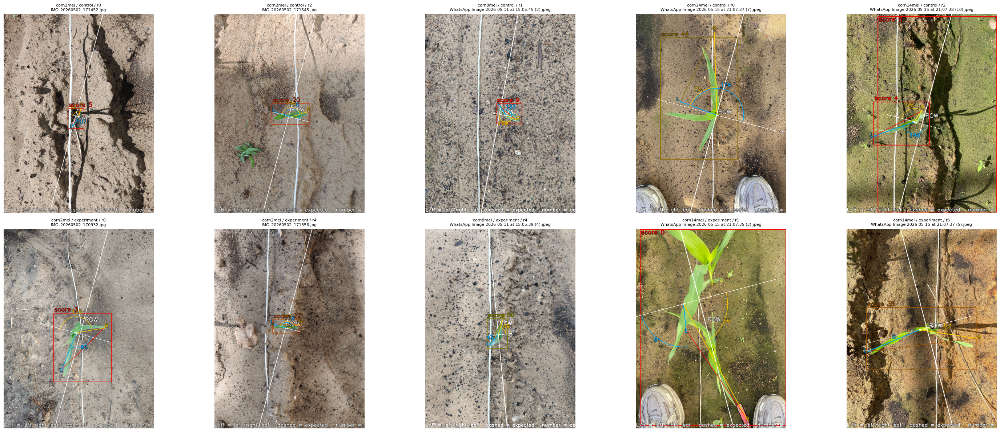

In [82]:
# Generate 10 visualization plots across corn2mei, corn8mei, corn14mei:
# 5 control photos and 5 experiment photos.

from collections import defaultdict

TARGET_DATES = ("corn2mei", "corn8mei", "corn14mei")
N_PER_GROUP = 5

from PIL import Image, ImageOps

def load_image_bgr(img_path):
    """
    Load an image with EXIF orientation applied, then return BGR for OpenCV.
    """
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img)
    img_rgb = np.array(img.convert("RGB"))
    return cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

def _evenly_pick(items, n):
    """Pick n items spread across the full ordered list."""
    if len(items) <= n:
        return items
    idxs = np.linspace(0, len(items) - 1, n).round().astype(int)
    return [items[i] for i in idxs]


# Collect candidate photos that belong to rows with a fitted line.
candidates = defaultdict(list)

for row_key, rd in sorted(row_data.items()):
    if rd["line"] is None:
        continue
    if rd["date"] not in TARGET_DATES:
        continue

    seen_paths = set()
    for img_path, _ in rd["observations"]:
        if img_path in seen_paths:
            continue
        seen_paths.add(img_path)

        plants_in = [p for ip, p in rd["observations"] if ip == img_path]
        if not plants_in:
            continue

        candidates[rd["group"]].append((rd["date"], row_key, img_path, rd, plants_in))


selected = []
for group in ("control", "experiment"):
    group_items = sorted(
        candidates[group],
        key=lambda x: (TARGET_DATES.index(x[0]), _natural_photo_key(x[2]))
    )
    selected.extend(_evenly_pick(group_items, N_PER_GROUP))

if not selected:
    raise RuntimeError("No visualization candidates found. Run the pipeline cell first.")

# Plot selected photos.
fig, axes = plt.subplots(2, 5, figsize=(30, 12))
axes = axes.ravel()

for ax, (date, row_key, img_path, rd, plants_in) in zip(axes, selected):
    img = load_image_bgr(img_path)

    for p in plants_in:
        p["row_id"] = 0

    score_plants(plants_in, {0: rd["line"]})
    vis = visualize_alignment(img, plants_in, {0: rd["line"]})

    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{date} / {rd['group']} / r{rd['local_row']}\n{img_path.name}", fontsize=8)
    ax.axis("off")

for ax in axes[len(selected):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

# Results: Control vs Experiment Alignment

This section compares control and experiment plants using three kinds of alignment measurements.

- **Plant alignment score** combines positional alignment and whole-plant angular alignment into one 0-100 score. Higher is better.
- **Mean positional deviation** measures how far the stem is from the fitted row line, in pixels. Lower is better.
- **Mean axis angular deviation** measures how far the plant's overall leaf axis is from the expected direction perpendicular to the row. Lower is better.
- **Mean left/right leaf deviation** measures each individual leaf tip direction against its expected left/right perpendicular direction. These leaf metrics are descriptive only and do not directly affect the plant score.

Important note: the positional metric depends on the fitted row line, while the axis and leaf-angle metrics come from each plant's own detected keypoints.

####################################################################################
#  SUMMARY OF RESULTS
####################################################################################

We scored 146 corn plants in total: 47 in CONTROL rows
(planted along a standard seeding line) and 99 in EXPERIMENT rows
(planted without a careful line).

  Average alignment score   CONTROL :  27.8 / 100
                            EXPERIMENT:  28.6 / 100
                            difference:   0.7 points  (higher = better aligned)

In this run, EXPERIMENT plants are better aligned on average. The alignment
score combines two things for each plant:
  • how close its stem sits to the row's seeding line   (positional)
  • how close its leaf axis is to perpendicular-to-row   (angular)

The tables below break this down per row and per date, and the plot at the end
shows the full spread of scores for the two groups side by side.

(Reminder: the seeding line for each row is fitted to the average st

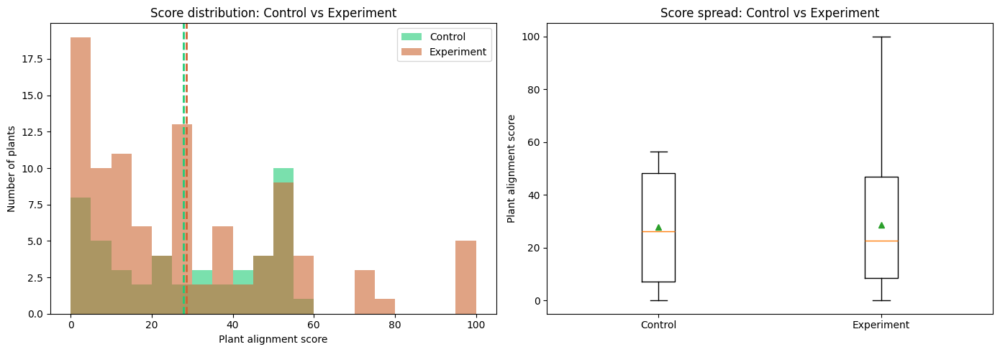

In [83]:
import pandas as pd
import numpy as np

rows_df   = pd.read_csv(OUT_DIR / 'rows.csv')
plants_df = pd.read_csv(OUT_DIR / 'plants.csv')
scored = plants_df.dropna(subset=['plant_score'])

def f1(v): return f"{v:.1f}" if pd.notna(v) else "N/A"

# ══════════════════════════════════════════════════════════════════════════════
# SUMMARY — the headline finding in plain language (read this first)
# ══════════════════════════════════════════════════════════════════════════════
_ctrl = scored[scored['group'] == 'control']['plant_score'].dropna()
_expr = scored[scored['group'] == 'experiment']['plant_score'].dropna()
_cmean, _emean = _ctrl.mean(), _expr.mean()
_better = "control" if _cmean > _emean else "experiment"
_diff = abs(_cmean - _emean)

print("#"*84)
print("#  SUMMARY OF RESULTS")
print("#"*84)
print(f"""
We scored {len(scored)} corn plants in total: {len(_ctrl)} in CONTROL rows
(planted along a standard seeding line) and {len(_expr)} in EXPERIMENT rows
(planted without a careful line).

  Average alignment score   CONTROL : {_cmean:5.1f} / 100
                            EXPERIMENT: {_emean:5.1f} / 100
                            difference: {_diff:5.1f} points  (higher = better aligned)

In this run, {_better.upper()} plants are better aligned on average. The alignment
score combines two things for each plant:
  • how close its stem sits to the row's seeding line   (positional)
  • how close its leaf axis is to perpendicular-to-row   (angular)

The tables below break this down per row and per date, and the plot at the end
shows the full spread of scores for the two groups side by side.
""")
print("(Reminder: the seeding line for each row is fitted to the average stem")
print(" position of that row's plants — approximate, because the photos are")
print(" close-ups with only roughly consistent framing.)")


# ── 1) Per-row table ──────────────────────────────────────────────────────────
print("="*84)
print("1) PER-ROW RESULTS")
print("="*84)
print(f"{'Row key':<26} | {'Grp':>10} | {'n':>3} | {'Score':>6} | "
      f"{'MeanPos':>8} | {'MeanAng':>8} | {'WinTol':>7} | {'LineAng':>8}")
print("-"*26 + "-+" + "-"*12 + "+" + "-"*5 + "+" + "-"*8 + "+" +
      "-"*10 + "+" + "-"*10 + "+" + "-"*9 + "+" + "-"*9)
for _, r in rows_df.sort_values(['date', 'group', 'local_row']).iterrows():
    print(f"{r['row_key']:<26} | {r['group']:>10} | {int(r['n_plants']):>3} | "
          f"{r['mean_score']:>6.1f} | {f1(r['mean_pos_px']):>8} | "
          f"{f1(r['mean_ang_deg']):>8} | {r['within_tol_pct']:>6.1f}% | "
          f"{r['line_angle_deg']:>+7.1f}{chr(176)}")

def block_stats(df):
    s = df['plant_score'].dropna()

    left_leaf = df['left_leaf_dev_deg'].dropna() if 'left_leaf_dev_deg' in df else pd.Series(dtype=float)
    right_leaf = df['right_leaf_dev_deg'].dropna() if 'right_leaf_dev_deg' in df else pd.Series(dtype=float)
    both_leaf = pd.concat([left_leaf, right_leaf], ignore_index=True)

    return dict(
        n=len(s),
        mean=s.mean(),
        std=s.std(),
        median=s.median(),
        within=100.0 * (df['pos_dev_px'] <= POS_TOLERANCE_PX).mean() if 'pos_dev_px' in df else np.nan,
        mean_pos=df['pos_dev_px'].mean(),
        mean_ang=df['ang_dev_deg'].mean(),                 # whole plant axis deviation
        mean_left_leaf=left_leaf.mean(),                   # individual left leaf deviation
        mean_right_leaf=right_leaf.mean(),                 # individual right leaf deviation
        mean_leaf=both_leaf.mean(),                        # both leaves pooled
    )

# ── 2) Per-date averages (control vs experiment) ──────────────────────────────
print("\n" + "="*84)
print("2) PER-DATE AVERAGES  (plant-level)")
print("="*84)
print(f"{'Date':<12} | {'Group':>10} | {'n':>4} | {'Mean score':>10} | "
      f"{'Std':>6} | {'MeanPos':>8} | {'AxisAng':>8} | {'LeafAng':>8}")
print("-"*13 + "+" + "-"*12 + "+" + "-"*6 + "+" + "-"*12 + "+" +
      "-"*8 + "+" + "-"*10 + "+" + "-"*10 + "+" + "-"*10)
for date in sorted(scored['date'].unique()):
    for group in ('control', 'experiment'):
        sub = scored[(scored['date'] == date) & (scored['group'] == group)]
        if len(sub) == 0:
            continue
        st = block_stats(sub)
        print(f"{date:<12} | {group:>10} | {st['n']:>4} | {st['mean']:>10.1f} | "
      f"{st['std']:>6.1f} | {st['mean_pos']:>7.1f}px | "
      f"{st['mean_ang']:>7.1f}{chr(176)} | {st['mean_leaf']:>7.1f}{chr(176)}")

# ── 3) Overall averages across all photos ─────────────────────────────────────
print("\n" + "="*84)
print("3) OVERALL AVERAGES  (all photos pooled)")
print("="*84)
allst = block_stats(scored)
print(f"  Plants scored        : {allst['n']}")
print(f"  Mean alignment score : {allst['mean']:.1f}  (std {allst['std']:.1f})")
print(f"  Mean positional dev  : {allst['mean_pos']:.1f} px")
print(f"  Mean angular dev     : {allst['mean_ang']:.1f}{chr(176)}")
print(f"  Mean left leaf dev   : {allst['mean_left_leaf']:.1f}{chr(176)}")
print(f"  Mean right leaf dev  : {allst['mean_right_leaf']:.1f}{chr(176)}")
print(f"  Mean leaf dev pooled : {allst['mean_leaf']:.1f}{chr(176)}")

# ── 4) Full control-vs-experiment statistics ─────────────────────────────────
print("\n" + "="*84)
print("4) CONTROL vs EXPERIMENT  (the comparison)")
print("="*84)
ctrl = scored[scored['group'] == 'control']
expr = scored[scored['group'] == 'experiment']
cs, es = block_stats(ctrl), block_stats(expr)
print(f"{'Metric':<26} | {'Control':>12} | {'Experiment':>12} | {'Difference':>12}")
print("-"*27 + "+" + "-"*14 + "+" + "-"*14 + "+" + "-"*13)
def row(metric, c, e, suf=""):
    d = c - e if (pd.notna(c) and pd.notna(e)) else float('nan')
    print(f"{metric:<26} | {c:>11.1f}{suf} | {e:>11.1f}{suf} | {d:>+11.1f}{suf}")
row("Plants (n)", cs['n'], es['n'])
row("Mean alignment score", cs['mean'], es['mean'])
row("Median score", cs['median'], es['median'])
row("Std (spread)", cs['std'], es['std'])
row("Mean positional dev", cs['mean_pos'], es['mean_pos'], "px")
row("Mean angular dev", cs['mean_ang'], es['mean_ang'], chr(176))
row("Mean left leaf dev", cs['mean_left_leaf'], es['mean_left_leaf'], chr(176))
row("Mean right leaf dev", cs['mean_right_leaf'], es['mean_right_leaf'], chr(176))
row("Mean leaf dev pooled", cs['mean_leaf'], es['mean_leaf'], chr(176))

# Optional significance test if scipy is available
try:
    from scipy import stats as _sps
    t, pval = _sps.ttest_ind(ctrl['plant_score'].dropna(),
                             expr['plant_score'].dropna(), equal_var=False)
    print(f"\n  Welch t-test on plant scores: t={t:.2f}, p={pval:.4g}")
    print("  (p < 0.05 => control and experiment scores differ significantly)")
except Exception:
    print("\n  (install scipy for a significance test on the difference)")

# ── 5) Distribution plot ──────────────────────────────────────────────────────
import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
bins = np.linspace(0, 100, 21)
ax1.hist(ctrl['plant_score'].dropna(), bins=bins, alpha=0.6, label='Control', color='#2c7')
ax1.hist(expr['plant_score'].dropna(), bins=bins, alpha=0.6, label='Experiment', color='#c63')
ax1.axvline(cs['mean'], color='#2c7', ls='--', lw=2)
ax1.axvline(es['mean'], color='#c63', ls='--', lw=2)
ax1.set_xlabel('Plant alignment score'); ax1.set_ylabel('Number of plants')
ax1.set_title('Score distribution: Control vs Experiment'); ax1.legend()

data = [ctrl['plant_score'].dropna().values, expr['plant_score'].dropna().values]
ax2.boxplot(data, tick_labels=['Control', 'Experiment'], showmeans=True)
ax2.set_ylabel('Plant alignment score')
ax2.set_title('Score spread: Control vs Experiment')
plt.tight_layout(); plt.show()


# 11. Closing notes

## The five deliverables, mapped to code

| Deliverable | Where |
|-------------|-------|
| 1. Corn detection model | §4 trains yolo11-pose; §5 validates it |
| 2. Position and orientation per plant | §6 returns stem and leaf axis per plant |
| 3. Optimal growth line per row | §10 fits one line per row pooling all stems |
| 4. Deviation from optimal | §9 computes positional (pixels) and angular (degrees) deviation |
| 5. Plant and row alignment scores | §10 batch CSV export |

## Knobs to adjust as the project evolves

| Knob | Cell | What it controls |
|------|------|------------------|
| POS_TOLERANCE_PX | §9 | Pixel offset where positional score drops to roughly 37% |
| ANG_TOLERANCE_DEG | §9 | Angle where angular score hits zero |
| EXPECTED_LEAF_OFFSET_DEG | §9 | 90 for a perpendicular trial, 0 for an along-row trial |
| residual_threshold in from_ransac | §10 | How strict the line fit is about outliers |

## What is not in this notebook

- **Pixel to centimeter conversion.** This needs camera calibration. Once you have that number, add a single PX_PER_CM constant and multiply wherever needed.
- **Real-time and robot integration.** That lives in the companion notebook Corn_Alignment_Prototype_Video.ipynb, which shares sections 1-6 and 8-9 with this one but replaces section 7 onward with a live video stream pipeline.